In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/My Drive/Colab Notebooks/DIP_Work

/content/drive/My Drive/Colab Notebooks/DIP_Work


In [ ]:
! pip install mtcnn;

     |████████████████████████████████| 2.3MB 7.6MB/s 


In [ ]:
# from face_recognition.face_recognition import face_locations
from mtcnn import MTCNN
from sklearn.metrics.pairwise import chi2_kernel
from sklearn.cluster import AgglomerativeClustering, OPTICS, KMeans, MeanShift, DBSCAN, Birch
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
import numpy as np
import matplotlib.pyplot as plt
import cv2
from cv2 import threshold
import pickle
from skimage.io import imread_collection
from skimage.measure import label, regionprops
from skimage.morphology import binary_closing, binary_opening, square
from skimage.color import rgb2gray

In [ ]:
 #your path
# col = [cv2.imread("ImageMe.jpeg")]
col_dir = 'dataset/images/*.jpg'
mask_dir = 'dataset/masks/*.png'
#creating a collection with the available images
col = imread_collection(col_dir)
true_masks = imread_collection(mask_dir)

In [ ]:
def GMM(clip, h, w, n_components):
    grid = np.indices((h, w)).reshape(h,w,-1)
    grid = np.dstack((clip, grid))
    inds = np.arange(h*w);
    vectors = grid[np.unravel_index(inds, (h,w))]
    labels = GaussianMixture(n_components, covariance_type='full').fit_predict(vectors)
    labels = np.reshape(labels,(h,w))
    return labels

def find_main_components(labels, clip, boxed_img,
                         eccentricity_upper=0.9,
                         relative_area_lower=0.1
                         ):
    main_components = []
    uniq = np.unique(labels)
    for j in uniq:
      binary = labels == j;
      binary = binary_opening(binary, square(3));
      binary = binary_closing(binary, square(3));
      components = label(binary, connectivity=2);
      # plt.imshow(components)
      # plt.show()
      props = regionprops(components);
      for i in range(0, len(props)):
        if props[i].eccentricity > eccentricity_upper or props[i].area/(h*w) < relative_area_lower:
          continue
        # print("eccentricity: ", props[i].eccentricity)
        # print("relative area: ", props[i].area/(h*w))
        # print("centroid: ", props[i].centroid)
        # plt.imshow(components == i+1, cmap="gray")
        # plt.show()
        main_components.append([props[i].eccentricity, props[i].area/(h*w), props[i].centroid, components == i+1])


    plt.figure(1)
    plt.subplot(1,3,1)
    plt.imshow(labels)
    plt.subplot(1,3,2)
    plt.imshow(clip)
    plt.subplot(1,3,3)
    plt.imshow(boxed_img)
    plt.show()

    return main_components

def dice_coef(A, B):
  return 2*np.count_nonzero(A*B)/(np.count_nonzero(A) + np.count_nonzero(B))





confidence:  0.997217059135437


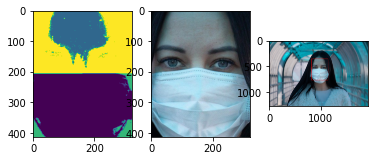

index:  0
dice coefficient:  0.8653663708912328
MASKS:


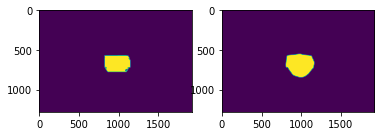

confidence:  0.9992220401763916


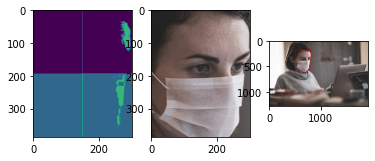

index:  1
dice coefficient:  0.7635999887815869
MASKS:


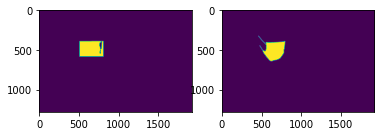

confidence:  0.9981354475021362
EXCEPTION RAISED
confidence:  0.9999620914459229


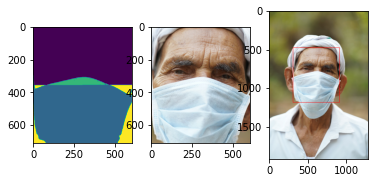

index:  3
dice coefficient:  0.8271394711518797
MASKS:


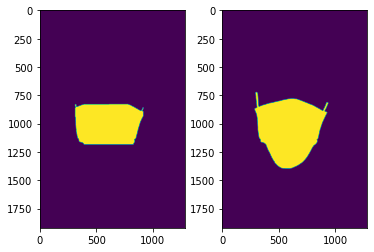

confidence:  0.9905727505683899


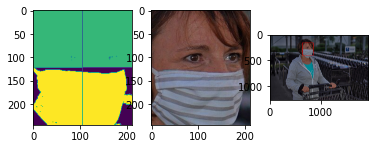

index:  4
dice coefficient:  0.8719452181014805
MASKS:


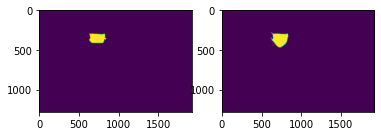

confidence:  0.9989079236984253


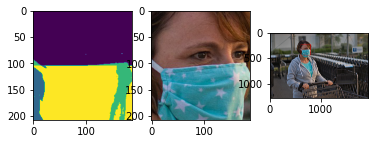

index:  5
dice coefficient:  0.7628827383340019
MASKS:


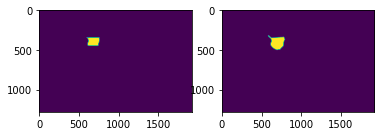

confidence:  0.9978433847427368


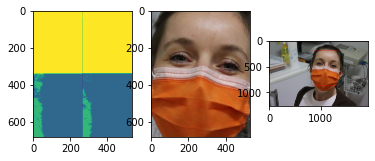

index:  6
dice coefficient:  0.7993050643702952
MASKS:


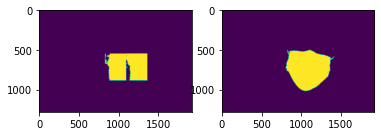

index:  7
dice coefficient:  0.0
MASKS:


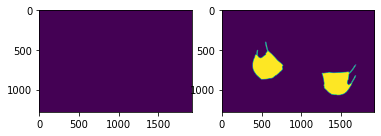

confidence:  0.9983429908752441


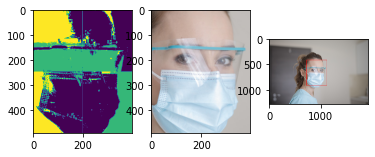

index:  8
dice coefficient:  0.8473613499195979
MASKS:


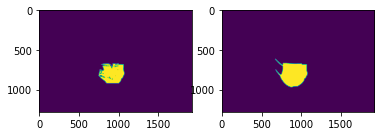

confidence:  0.9999514818191528


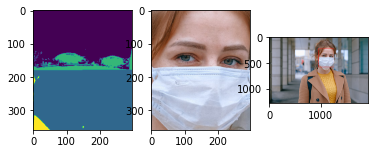

index:  9
dice coefficient:  0.8755393177128462
MASKS:


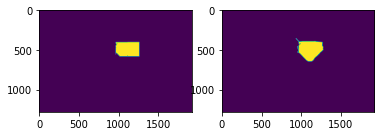

confidence:  0.9545267224311829


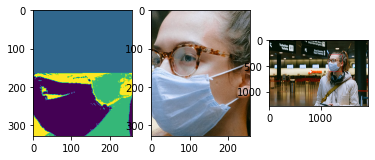

index:  10
dice coefficient:  0.8677771891616144
MASKS:


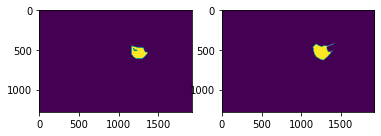

confidence:  0.9814661741256714


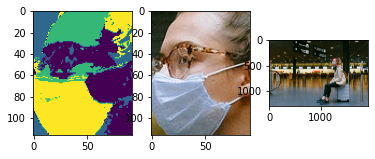

index:  11
dice coefficient:  0.8616636528028933
MASKS:


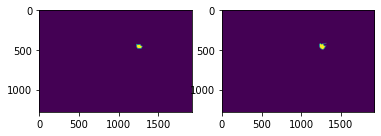

index:  12
dice coefficient:  0.0
MASKS:


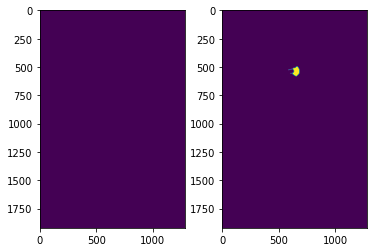

confidence:  0.9775519371032715


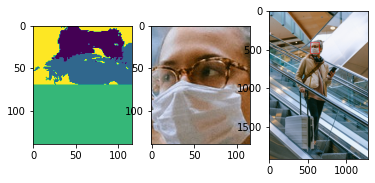

confidence:  0.8348488211631775


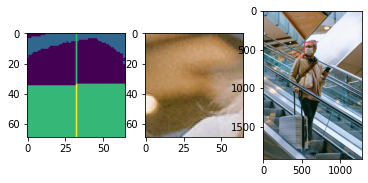

index:  13
dice coefficient:  0.7370173795400146
MASKS:


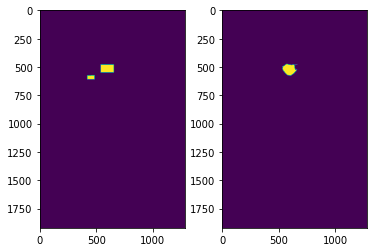

confidence:  0.9995570778846741


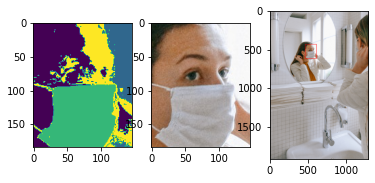

index:  14
dice coefficient:  0.9070118662351672
MASKS:


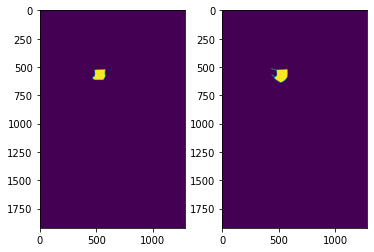

confidence:  0.9994162321090698


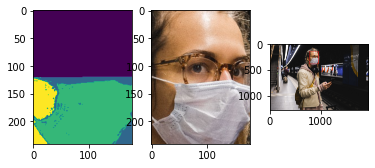

confidence:  0.7409458160400391


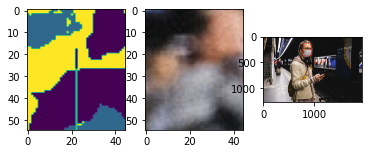

index:  15
dice coefficient:  0.8759269823160296
MASKS:


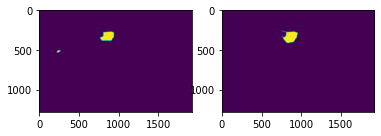

confidence:  0.9984096884727478


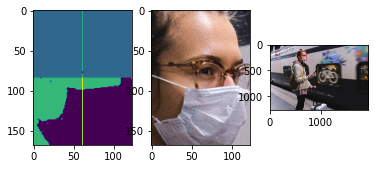

index:  16
dice coefficient:  0.8594273218068749
MASKS:


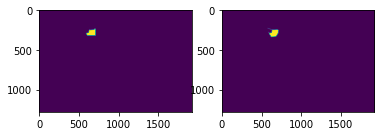

confidence:  0.9928914308547974


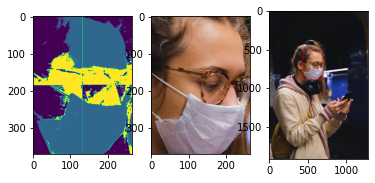

index:  17
dice coefficient:  0.9384862891126335
MASKS:


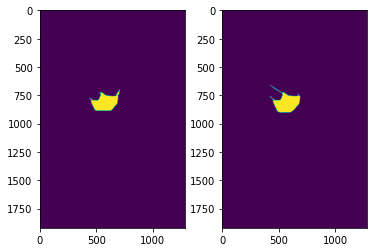

confidence:  0.984265923500061


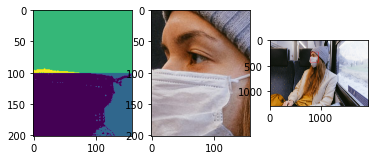

index:  18
dice coefficient:  0.026944585663446874
MASKS:


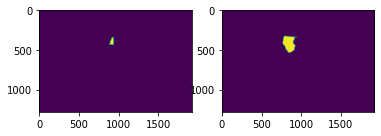

confidence:  0.9999210834503174


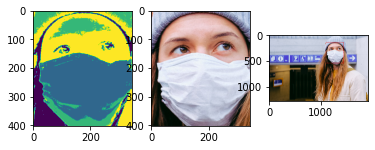

index:  19
dice coefficient:  0.8765475653279731
MASKS:


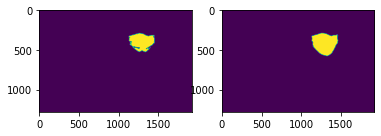

confidence:  0.9995131492614746


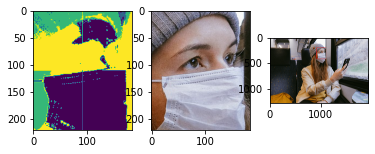

index:  20
dice coefficient:  0.7397687473012522
MASKS:


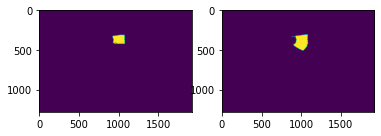

confidence:  0.9999213218688965


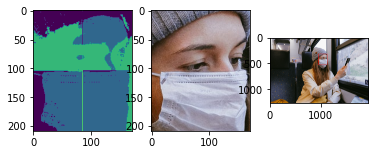

index:  21
dice coefficient:  0.69663560708443
MASKS:


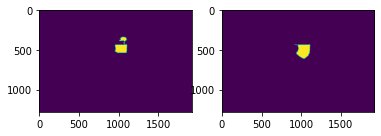

confidence:  0.9998738765716553


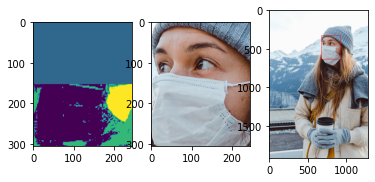

index:  22
dice coefficient:  0.6928757121522208
MASKS:


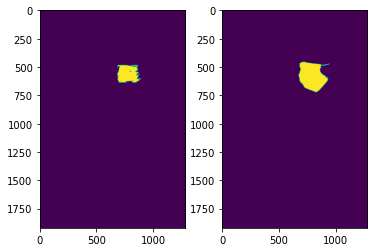

confidence:  0.9989689588546753


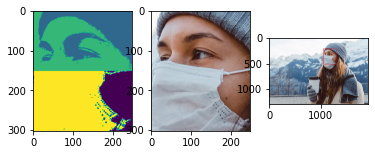

index:  23
dice coefficient:  0.7120778182005831
MASKS:


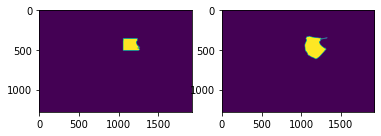

index:  24
dice coefficient:  0.0
MASKS:


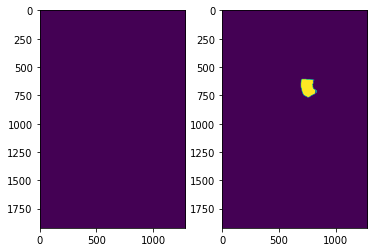

index:  25
dice coefficient:  0.0
MASKS:


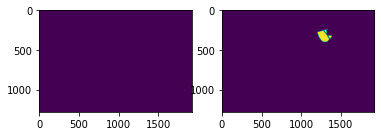

confidence:  0.9999929666519165


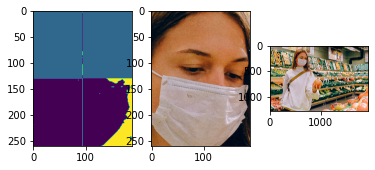

index:  26
dice coefficient:  0.899072661110459
MASKS:


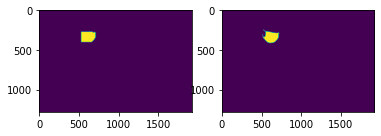

confidence:  0.8697772026062012


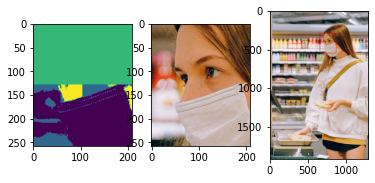

index:  27
dice coefficient:  0.6975280898876405
MASKS:


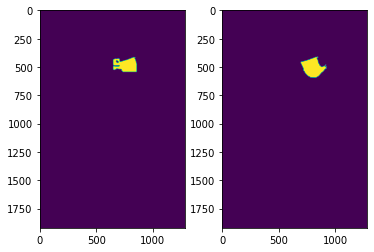

confidence:  0.871076762676239


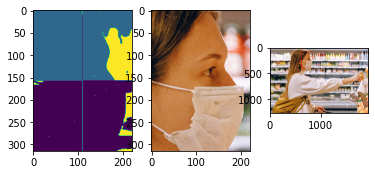

index:  28
dice coefficient:  0.6708201220077507
MASKS:


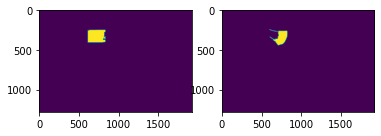

index:  29
dice coefficient:  0.0
MASKS:


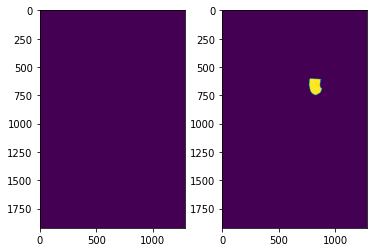

index:  30
dice coefficient:  0.0
MASKS:


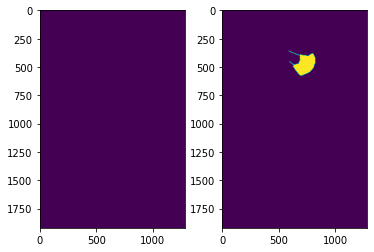

index:  31
dice coefficient:  0.0
MASKS:


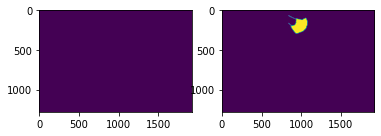

confidence:  0.9995784163475037


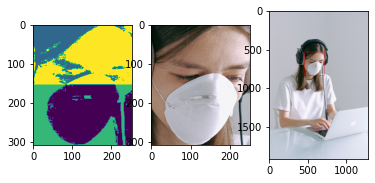

index:  32
dice coefficient:  0.8901380963492501
MASKS:


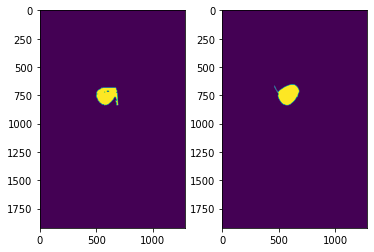

confidence:  0.9973389506340027


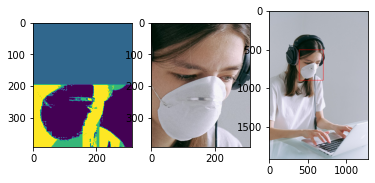

index:  33
dice coefficient:  0.0
MASKS:


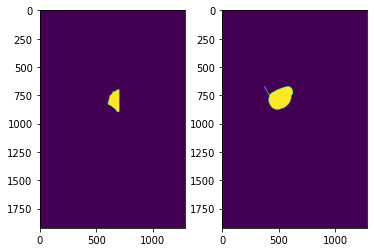

confidence:  0.9893966317176819


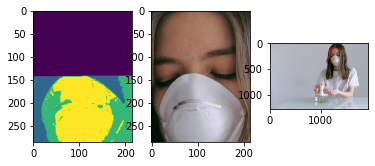

index:  34
dice coefficient:  0.6903125995358784
MASKS:


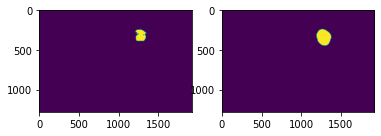

index:  35
dice coefficient:  0.0
MASKS:


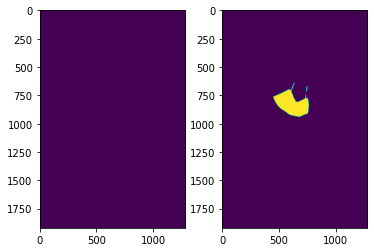

confidence:  0.9998667240142822


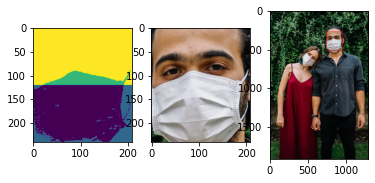

confidence:  0.9948232173919678


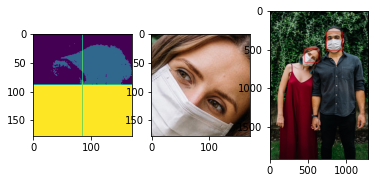

index:  36
dice coefficient:  0.7089844230627261
MASKS:


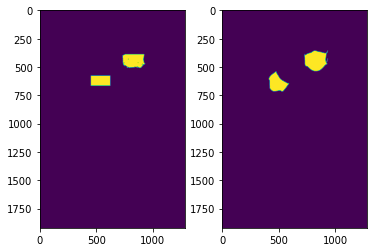

confidence:  0.999812662601471


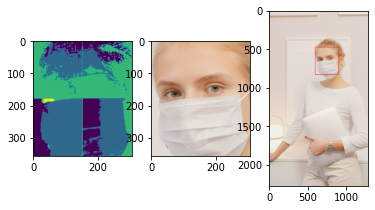

index:  37
dice coefficient:  0.77601363169595
MASKS:


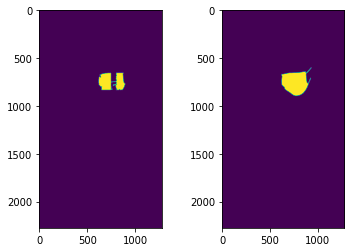

confidence:  0.9985365867614746


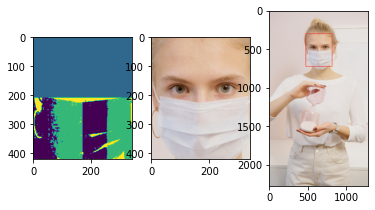

index:  38
dice coefficient:  0.441028396547092
MASKS:


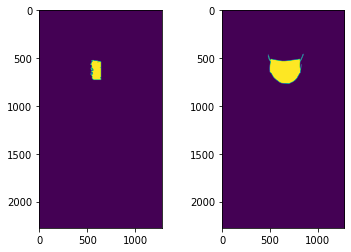

confidence:  0.9977219700813293


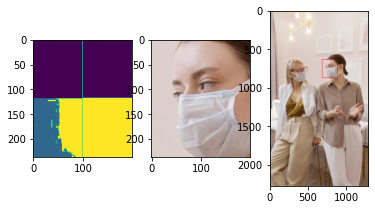

index:  39
dice coefficient:  0.0
MASKS:


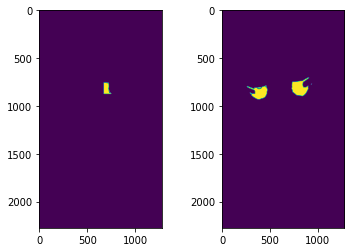

confidence:  0.9999173879623413


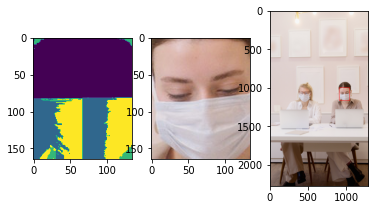

confidence:  0.9941743016242981


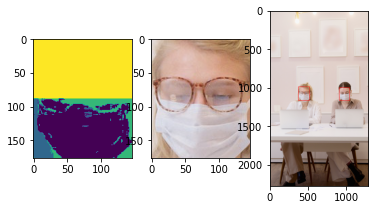

index:  40
dice coefficient:  0.6170212765957447
MASKS:


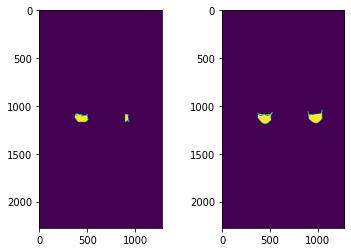

confidence:  0.9998410940170288


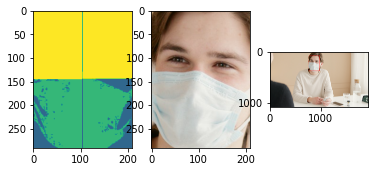

index:  41
dice coefficient:  0.8602927821569981
MASKS:


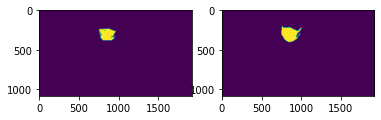

confidence:  0.9999198913574219


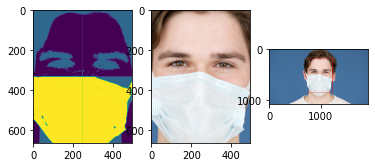

index:  42
dice coefficient:  0.9349701895948352
MASKS:


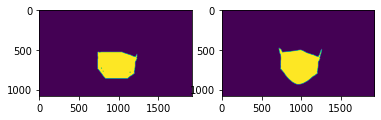

confidence:  0.9999165534973145


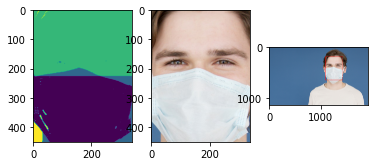

index:  43
dice coefficient:  0.8967032687065297
MASKS:


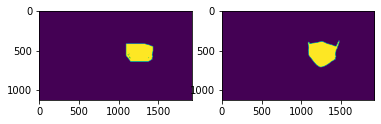

confidence:  0.9973046779632568


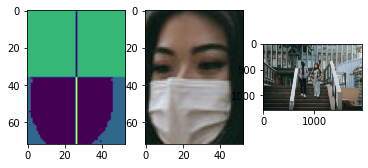

confidence:  0.8808145523071289


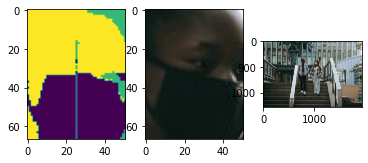

index:  44
dice coefficient:  0.8626771653543307
MASKS:


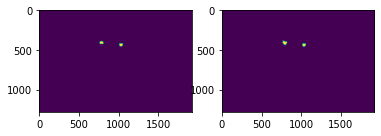

confidence:  0.9970964193344116


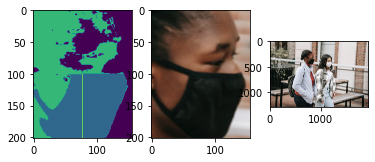

confidence:  0.9933212399482727


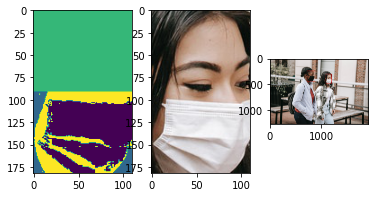

index:  45
dice coefficient:  0.8321130157636316
MASKS:


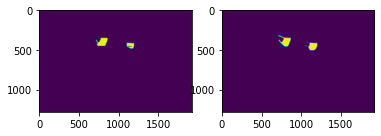

confidence:  0.9999651908874512


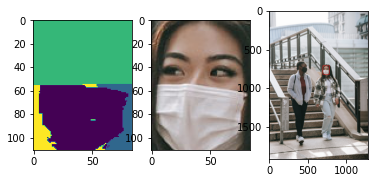

confidence:  0.9686474800109863


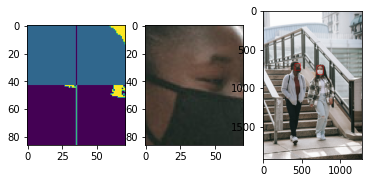

index:  46
dice coefficient:  0.7385897605503373
MASKS:


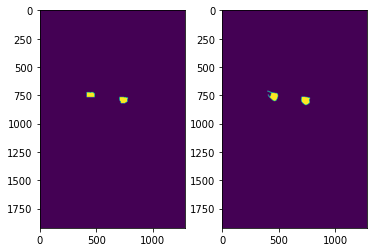

confidence:  0.9998185038566589


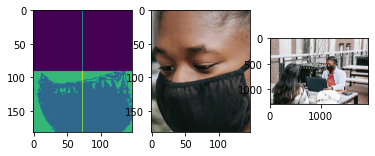

index:  47
dice coefficient:  0.8292307033691511
MASKS:


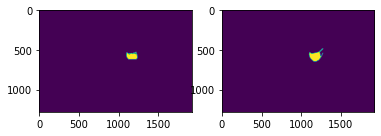

confidence:  0.9999257326126099


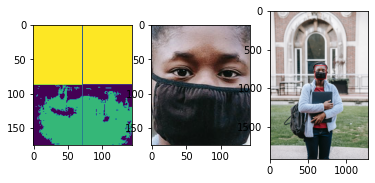

index:  48
dice coefficient:  0.716618808327351
MASKS:


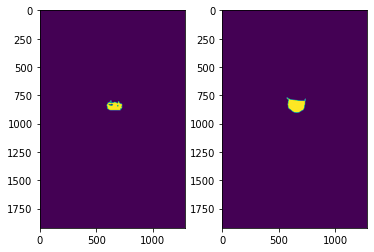

confidence:  0.999818742275238


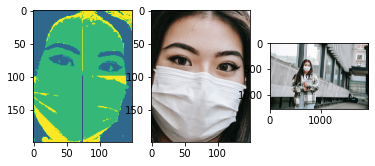

index:  49
dice coefficient:  0.7127512905190933
MASKS:


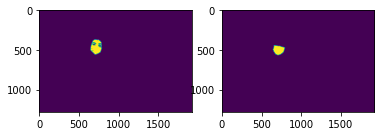

confidence:  0.9999321699142456


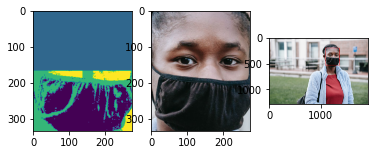

index:  50
dice coefficient:  0.629080118694362
MASKS:


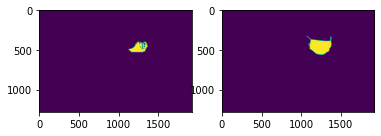

confidence:  0.9986708164215088


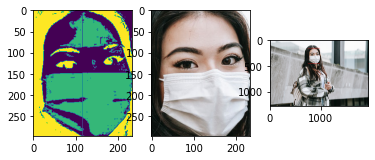

index:  51
dice coefficient:  0.8665086553519279
MASKS:


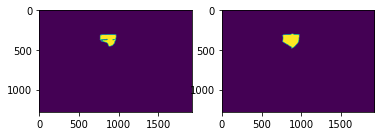

confidence:  0.9999731779098511


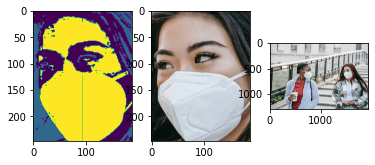

confidence:  0.9988706707954407


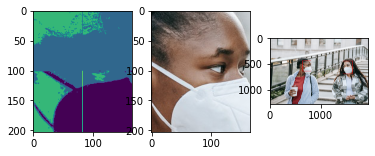

index:  52
dice coefficient:  0.7678812795674701
MASKS:


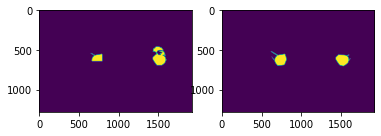

confidence:  0.9999856948852539


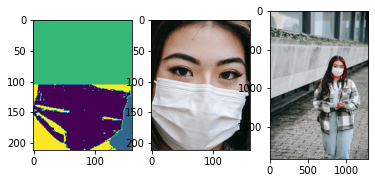

index:  53
dice coefficient:  0.8979419767753803
MASKS:


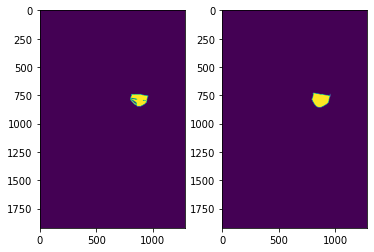

confidence:  0.9985800981521606


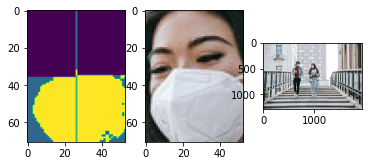

confidence:  0.9975276589393616


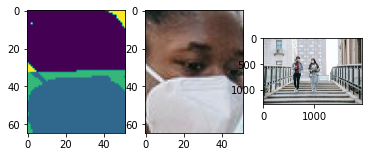

index:  54
dice coefficient:  0.8355542954352141
MASKS:


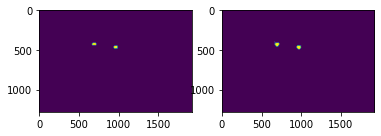

confidence:  0.9989702701568604


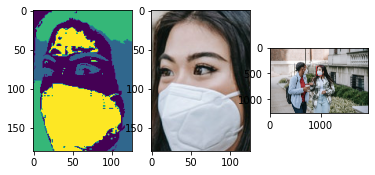

confidence:  0.8685280084609985


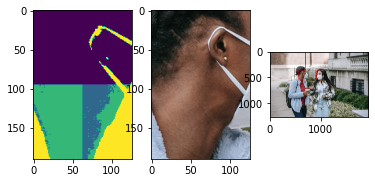

index:  55
dice coefficient:  0.5072378022324774
MASKS:


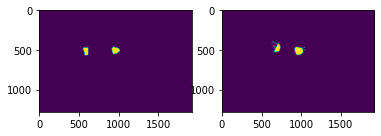

confidence:  0.9996845722198486


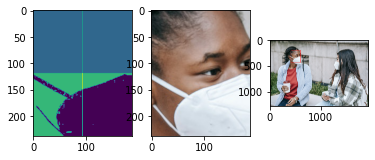

index:  56
dice coefficient:  0.03263309207373969
MASKS:


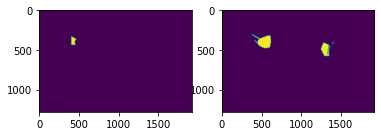

confidence:  0.999434769153595


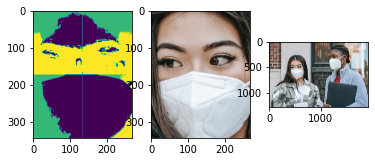

confidence:  0.9990699887275696


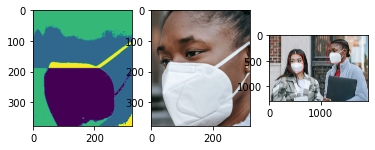

index:  57
dice coefficient:  0.9196007780364146
MASKS:


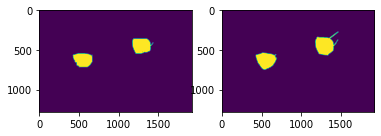

confidence:  0.9798495769500732


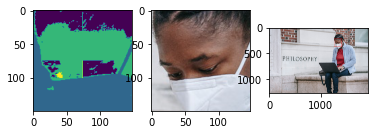

index:  58
dice coefficient:  0.6608292848265732
MASKS:


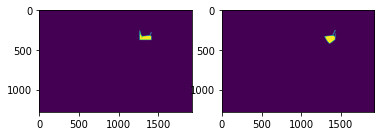

confidence:  0.9998383522033691


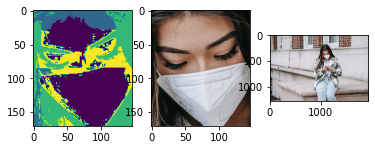

index:  59
dice coefficient:  0.8709806005846399
MASKS:


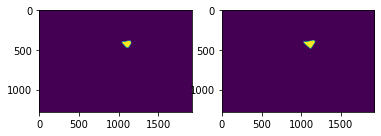

confidence:  0.9995818734169006


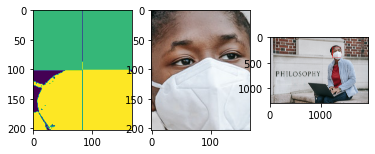

confidence:  0.9854369759559631


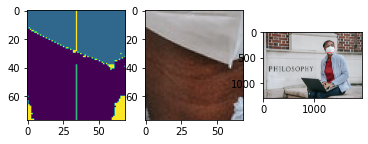

index:  60
dice coefficient:  0.7517067379044227
MASKS:


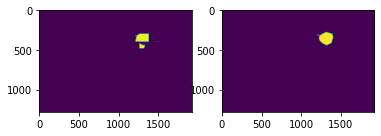

confidence:  0.9996707439422607


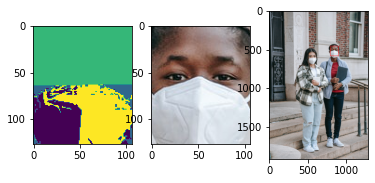

confidence:  0.9996284246444702


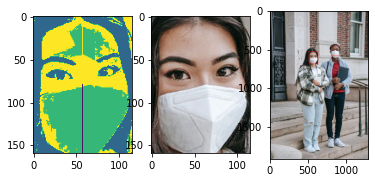

index:  61
dice coefficient:  0.6868721122461956
MASKS:


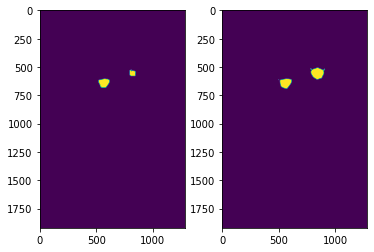

confidence:  0.8686507344245911


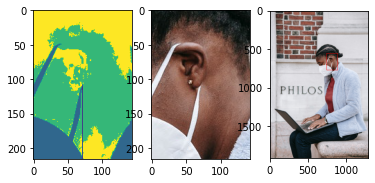

index:  62
dice coefficient:  0.27852545348156815
MASKS:


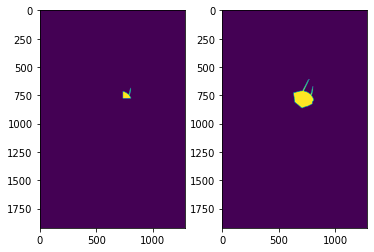

confidence:  0.9986861348152161


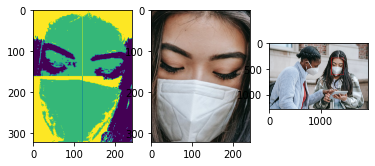

confidence:  0.9668881893157959


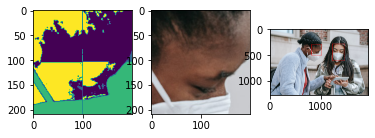

index:  63
dice coefficient:  0.4888984283704181
MASKS:


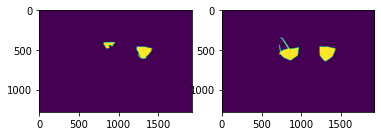

confidence:  0.9921696782112122


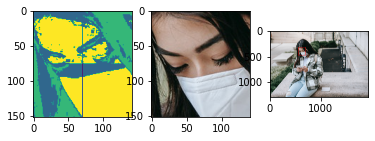

index:  64
dice coefficient:  0.7214444589820751
MASKS:


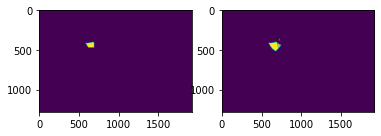

confidence:  0.9947793483734131


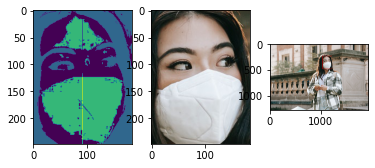

index:  65
dice coefficient:  0.8092900302114804
MASKS:


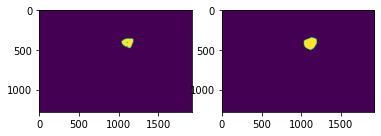

confidence:  0.998256266117096


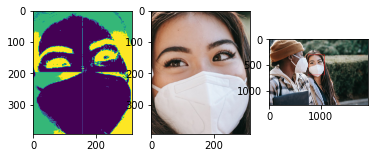

confidence:  0.843253493309021


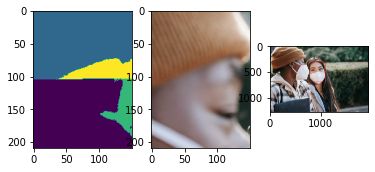

index:  66
dice coefficient:  0.44979194435287767
MASKS:


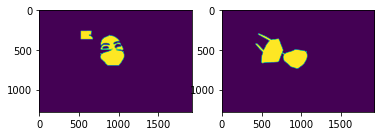

index:  67
dice coefficient:  0.0
MASKS:


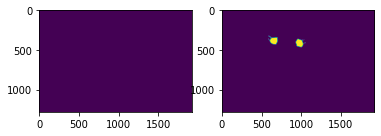

confidence:  0.773522138595581


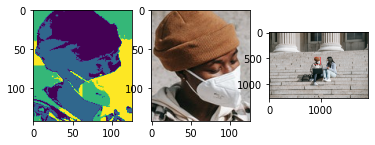

index:  68
dice coefficient:  0.3779088823336611
MASKS:


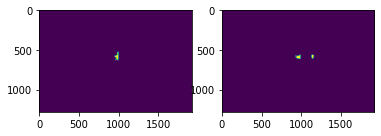

confidence:  0.9948270916938782


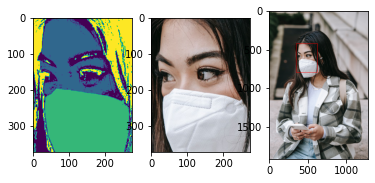

confidence:  0.7429838180541992


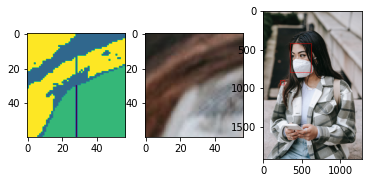

index:  69
dice coefficient:  0.8234953167022164
MASKS:


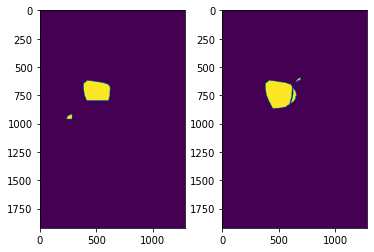

confidence:  0.999483585357666


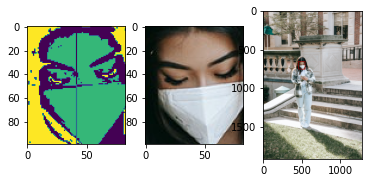

index:  70
dice coefficient:  0.698712189278227
MASKS:


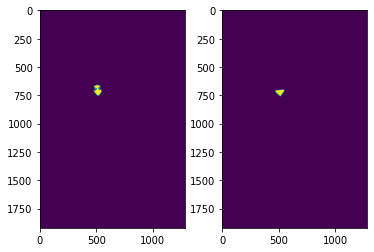

confidence:  0.9913241863250732


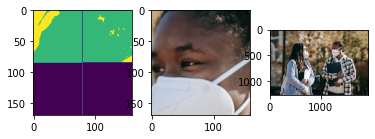

confidence:  0.8762691020965576


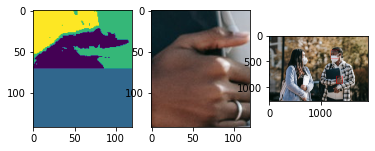

index:  71
dice coefficient:  0.330037900816171
MASKS:


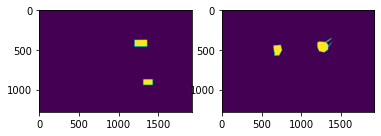

confidence:  0.9996722936630249


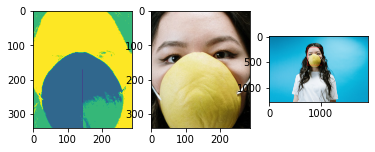

index:  72
dice coefficient:  0.7952085438014144
MASKS:


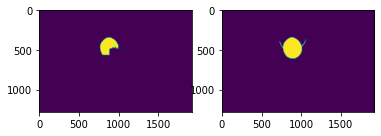

confidence:  0.9999992847442627


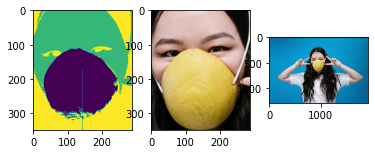

index:  73
dice coefficient:  0.8438395806601326
MASKS:


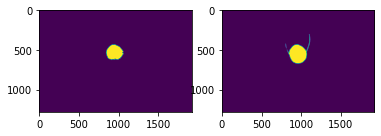

confidence:  0.9997187256813049


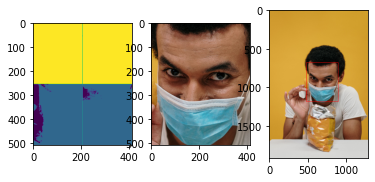

index:  74
dice coefficient:  0.7238478979248533
MASKS:


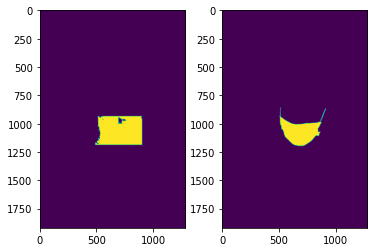

confidence:  0.9999834299087524


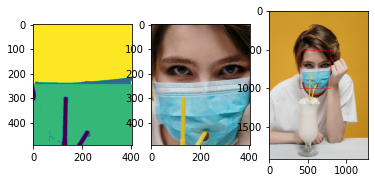

index:  75
dice coefficient:  0.8550717507175072
MASKS:


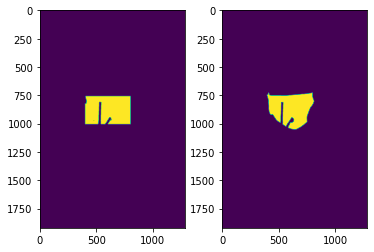

confidence:  0.9999998807907104


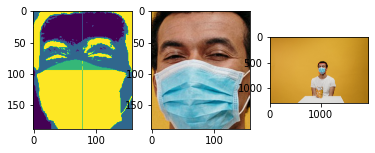

index:  76
dice coefficient:  0.891118800461361
MASKS:


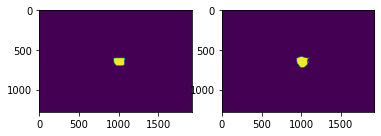

confidence:  0.9299513697624207


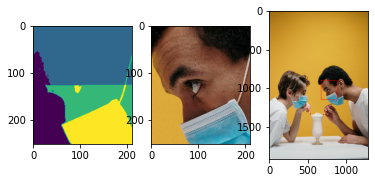

index:  77
dice coefficient:  0.34226495800803325
MASKS:


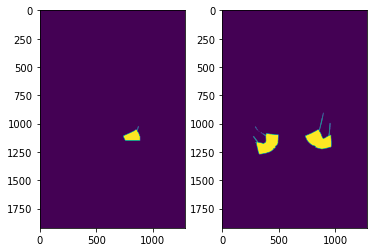

confidence:  0.999977707862854


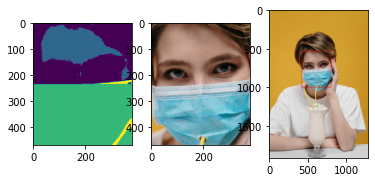

index:  78
dice coefficient:  0.8942980000714685
MASKS:


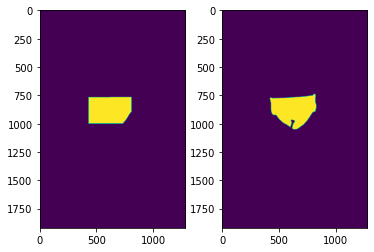

confidence:  0.9997438788414001


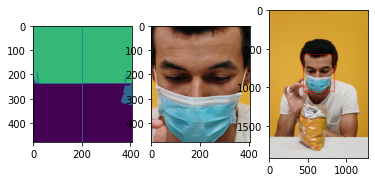

index:  79
dice coefficient:  0.7166284396089604
MASKS:


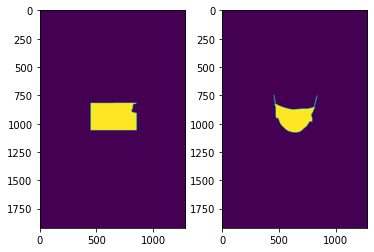

confidence:  0.9997332692146301


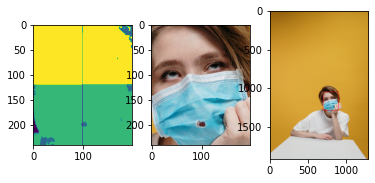

index:  80
dice coefficient:  0.7820279847355988
MASKS:


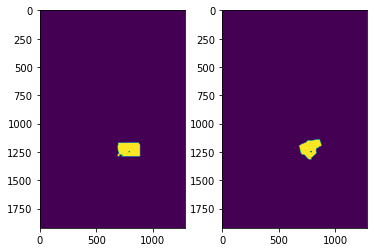

confidence:  0.999198853969574


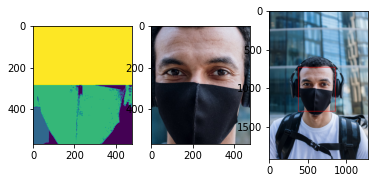

index:  81
dice coefficient:  0.9200463278505688
MASKS:


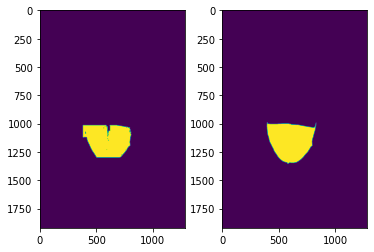

confidence:  0.9987049102783203


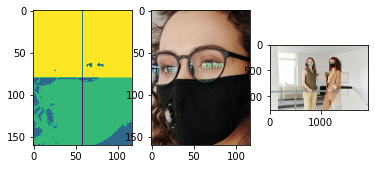

confidence:  0.9949384927749634


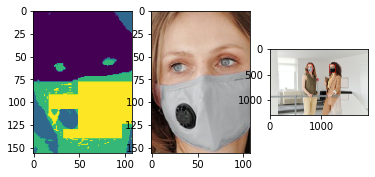

index:  82
dice coefficient:  0.8277060759587294
MASKS:


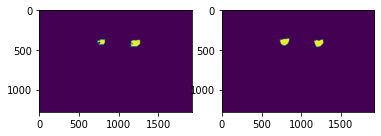

confidence:  0.9860123991966248


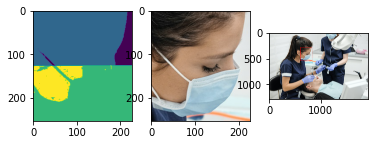

index:  83
dice coefficient:  0.42456704835809594
MASKS:


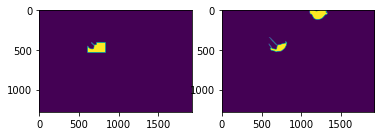

confidence:  0.9999483823776245


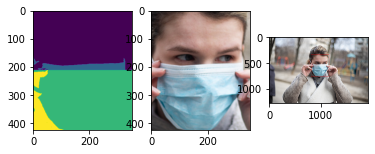

index:  84
dice coefficient:  0.826353920666053
MASKS:


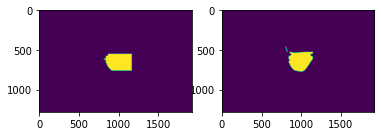

confidence:  0.9999943971633911


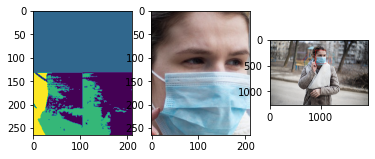

index:  85
dice coefficient:  0.4787178572408683
MASKS:


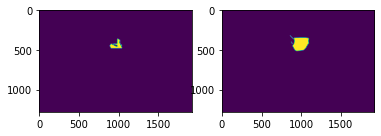

confidence:  0.9999943971633911


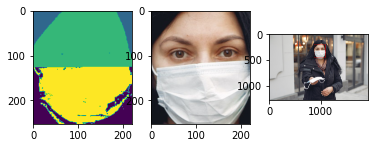

index:  86
dice coefficient:  0.809617291696181
MASKS:


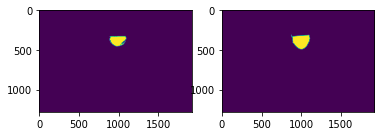

confidence:  0.9987694621086121


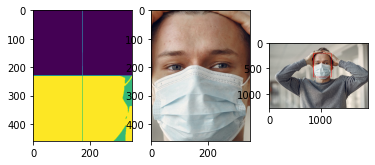

index:  87
dice coefficient:  0.8766476239108927
MASKS:


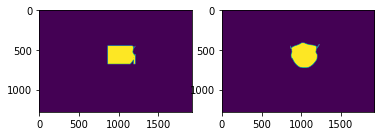

confidence:  0.999931812286377


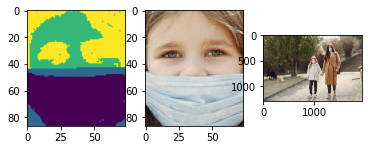

confidence:  0.9812774062156677


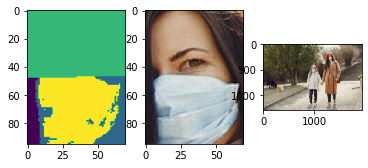

index:  88
dice coefficient:  0.8367855608079072
MASKS:


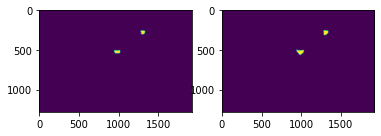

confidence:  0.9931718111038208


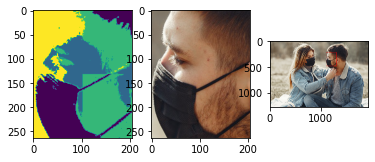

confidence:  0.9789560437202454


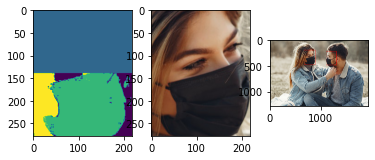

index:  89
dice coefficient:  0.8474219960168179
MASKS:


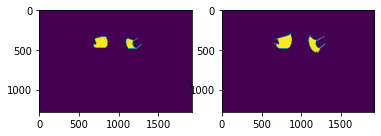

confidence:  0.9929054975509644


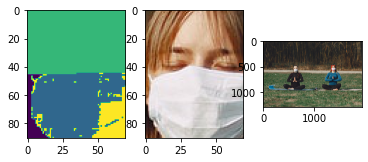

confidence:  0.9899255037307739


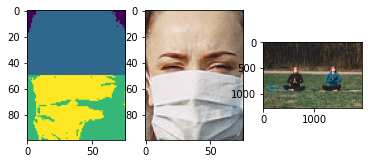

index:  90
dice coefficient:  0.572958038335348
MASKS:


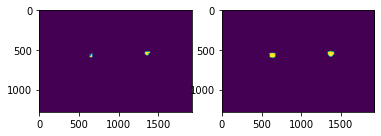

confidence:  0.9996042847633362


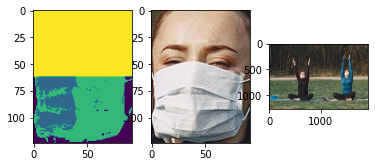

confidence:  0.9130063056945801


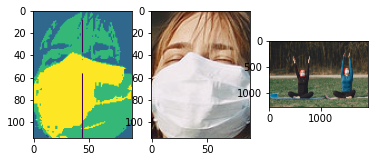

index:  91
dice coefficient:  0.5604751619870411
MASKS:


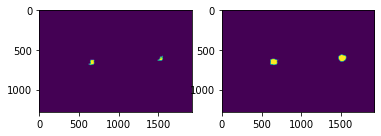

confidence:  0.9990491271018982


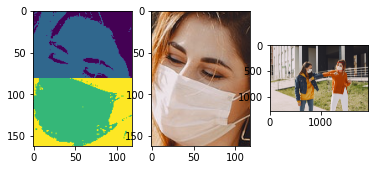

confidence:  0.8941060900688171


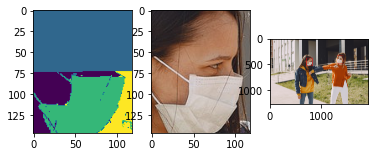

index:  92
dice coefficient:  0.4925168687534879
MASKS:


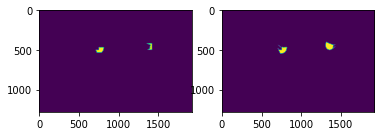

index:  93
dice coefficient:  0.0
MASKS:


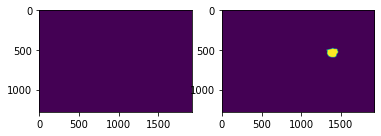

confidence:  0.9675036668777466


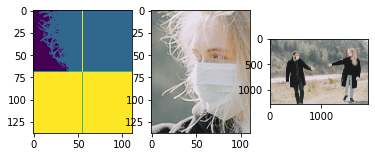

confidence:  0.8423454165458679


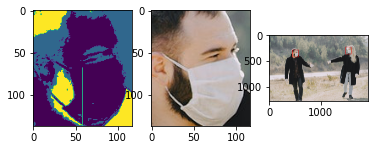

index:  94
dice coefficient:  0.5395013798587399
MASKS:


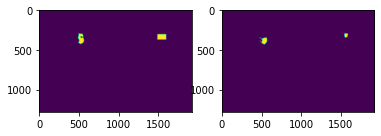

confidence:  0.9645508527755737


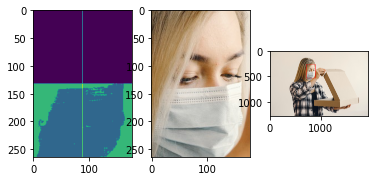

index:  95
dice coefficient:  0.8503617945007236
MASKS:


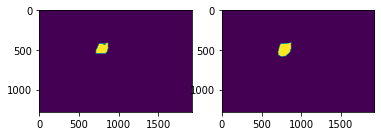

index:  96
dice coefficient:  0.0
MASKS:


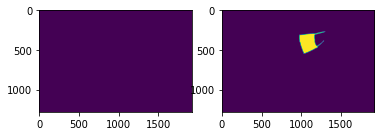

confidence:  0.9994636178016663


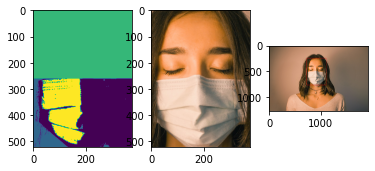

confidence:  0.7039358019828796


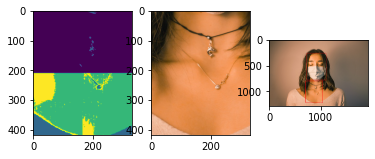

index:  97
dice coefficient:  0.4720819832717956
MASKS:


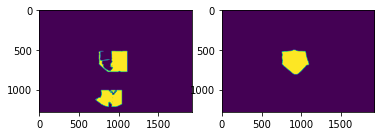

confidence:  0.999678373336792


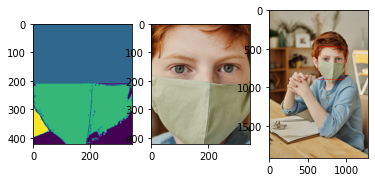

index:  98
dice coefficient:  0.8817072197846031
MASKS:


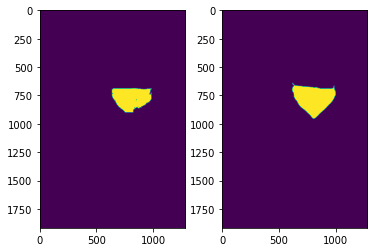

confidence:  0.9996106028556824


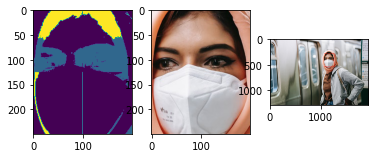

index:  99
dice coefficient:  0.734276379932607
MASKS:


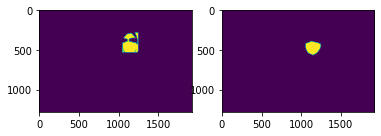

confidence:  0.999657392501831


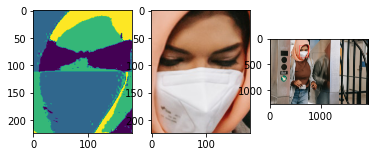

index:  100
dice coefficient:  0.8716796875
MASKS:


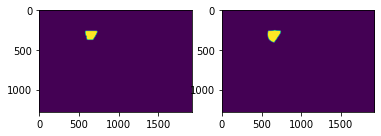

confidence:  0.8614200949668884


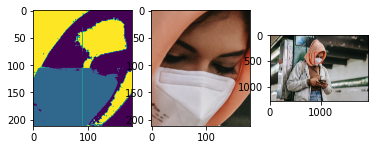

index:  101
dice coefficient:  0.8420014004710675
MASKS:


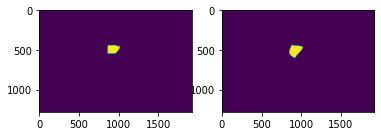

confidence:  0.9991142153739929


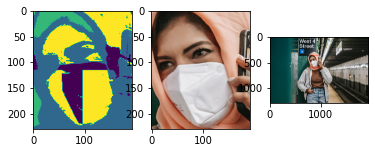

index:  102
dice coefficient:  0.724467517345107
MASKS:


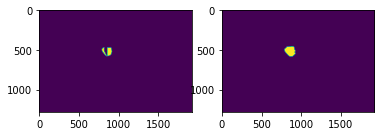

confidence:  0.9984323382377625


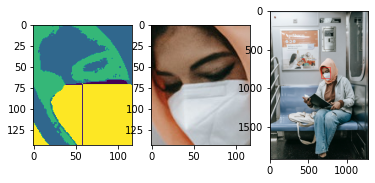

index:  103
dice coefficient:  0.8427559383247674
MASKS:


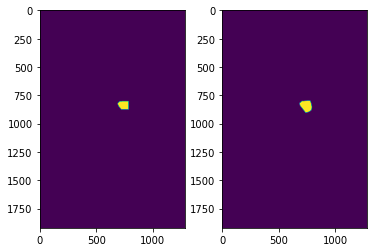

confidence:  0.9845006465911865


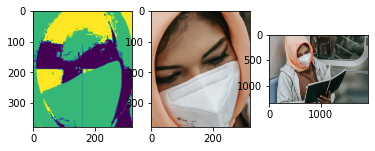

index:  104
dice coefficient:  0.7880718428670741
MASKS:


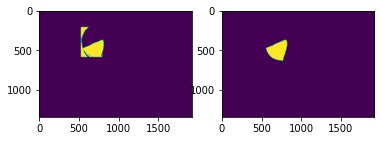

index:  105
dice coefficient:  0.0
MASKS:


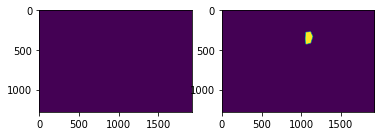

confidence:  0.9985080361366272


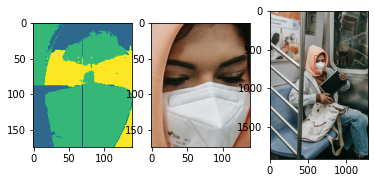

index:  106
dice coefficient:  0.8414545454545455
MASKS:


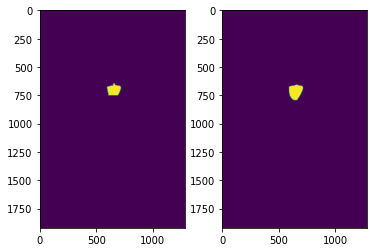

confidence:  0.9769574403762817


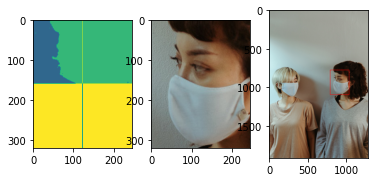

index:  107
dice coefficient:  0.509091287993248
MASKS:


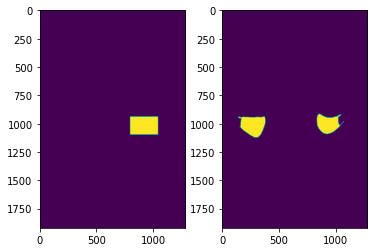

confidence:  0.9990500807762146


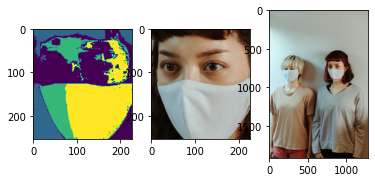

index:  108
dice coefficient:  0.48172722485518693
MASKS:


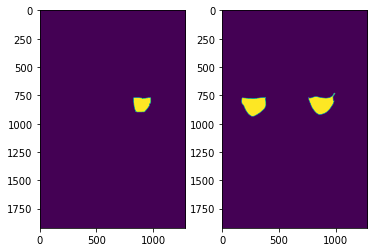

confidence:  0.9568007588386536


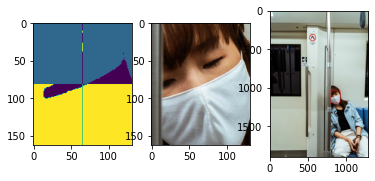

index:  109
dice coefficient:  0.8141735263506481
MASKS:


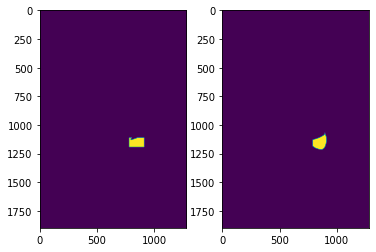

confidence:  0.9996621608734131


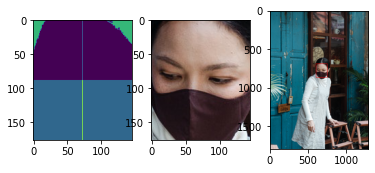

index:  110
dice coefficient:  0.7480680061823802
MASKS:


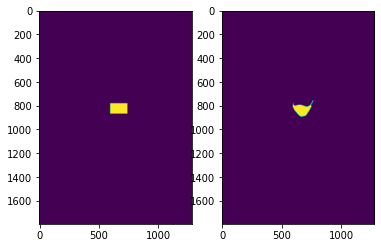

confidence:  0.9908314347267151


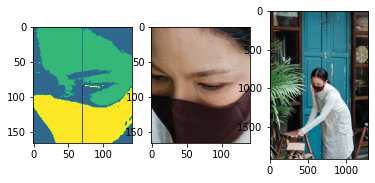

index:  111
dice coefficient:  0.8592778574844572
MASKS:


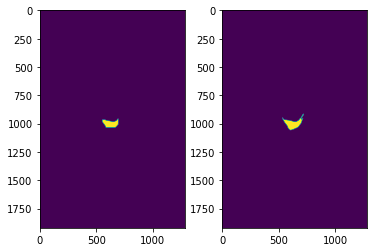

confidence:  0.9985789060592651


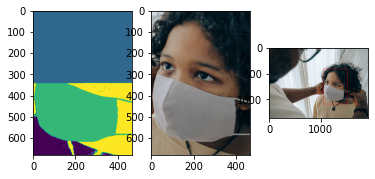

index:  112
dice coefficient:  0.9704963025081955
MASKS:


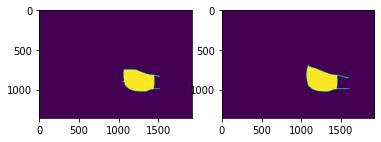

confidence:  0.9997422099113464


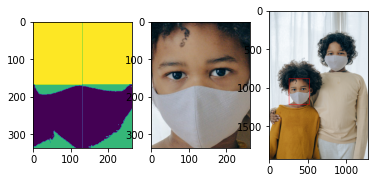

confidence:  0.980991542339325


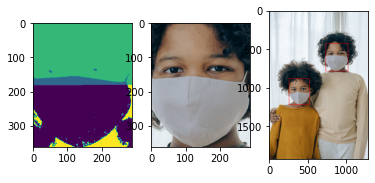

index:  113
dice coefficient:  0.8794988624833784
MASKS:


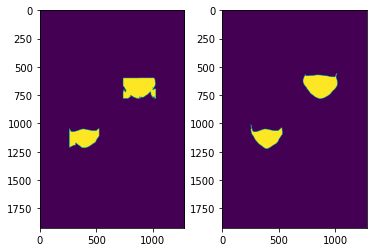

confidence:  0.9887222051620483


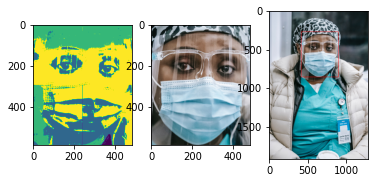

index:  114
dice coefficient:  0.5110605271760845
MASKS:


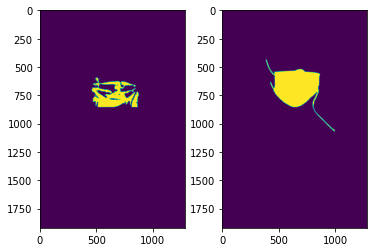

confidence:  0.9912328124046326


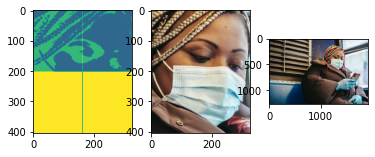

index:  115
dice coefficient:  0.6516742503791856
MASKS:


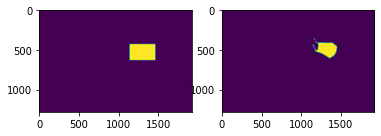

index:  116
dice coefficient:  0.0
MASKS:


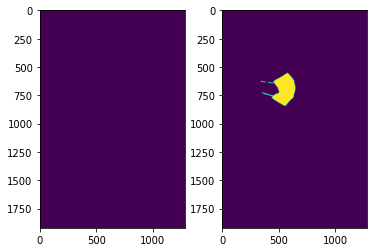

confidence:  0.994170606136322


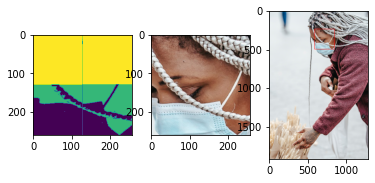

index:  117
dice coefficient:  0.5993862938970338
MASKS:


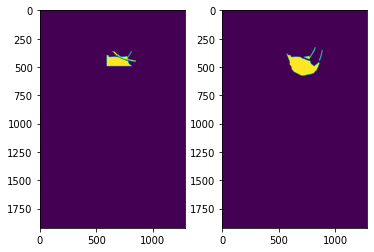

confidence:  0.9445756077766418


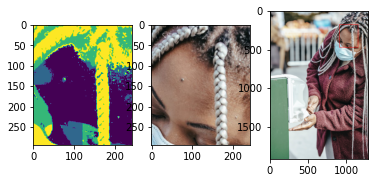

index:  118
dice coefficient:  0.0
MASKS:


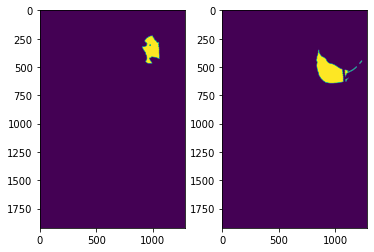

confidence:  0.9980803728103638


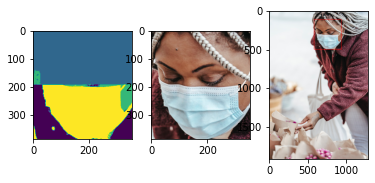

index:  119
dice coefficient:  0.9670025382662872
MASKS:


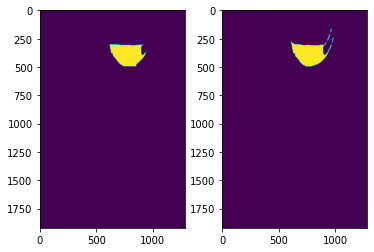

confidence:  0.955981969833374


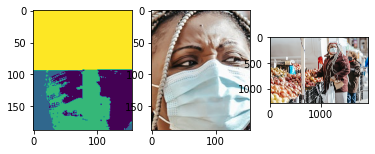

confidence:  0.7078770995140076


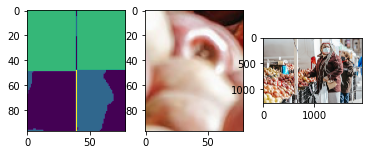

index:  120
dice coefficient:  0.39827682045580876
MASKS:


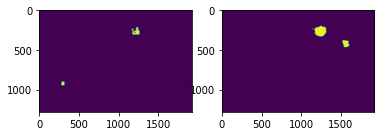

confidence:  0.9999351501464844


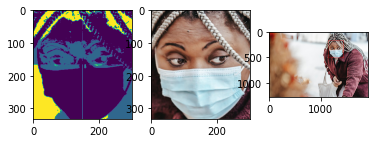

index:  121
dice coefficient:  0.7142857142857143
MASKS:


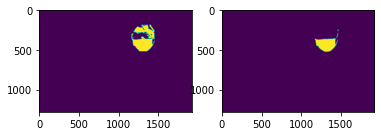

index:  122
dice coefficient:  0.0
MASKS:


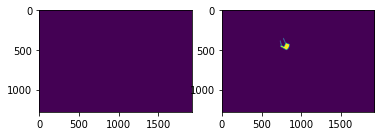

confidence:  0.998924195766449


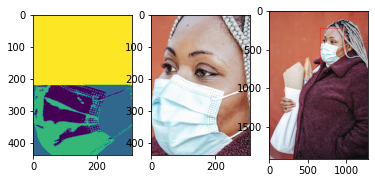

index:  123
dice coefficient:  0.5996360206697751
MASKS:


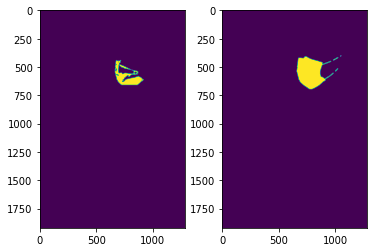

confidence:  0.9962131977081299


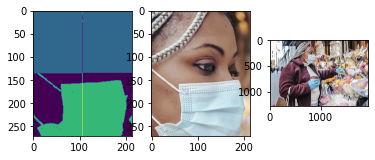

index:  124
dice coefficient:  0.7932417763934116
MASKS:


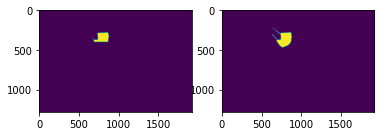

confidence:  0.9991874098777771


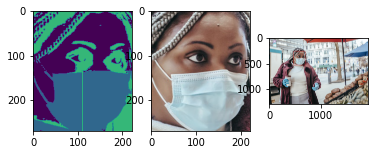

index:  125
dice coefficient:  0.9455073291452504
MASKS:


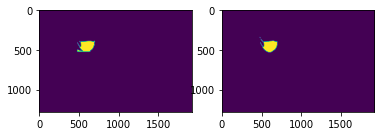

confidence:  0.9530565142631531


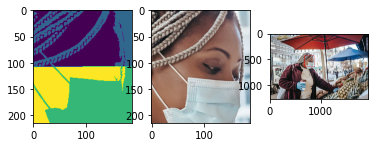

index:  126
dice coefficient:  0.7268323175496171
MASKS:


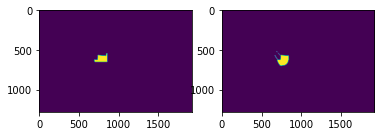

confidence:  0.8988699913024902


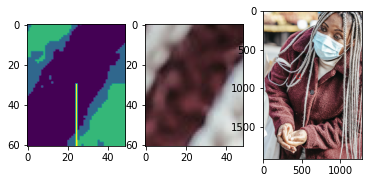

confidence:  0.7647594809532166


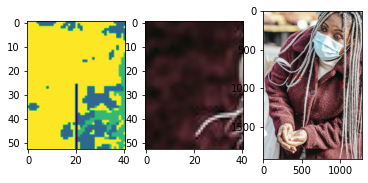

index:  127
dice coefficient:  0.0
MASKS:


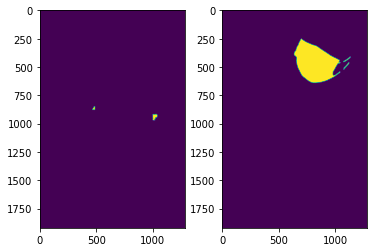

confidence:  0.9999427795410156


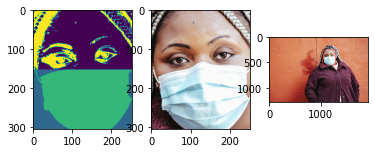

index:  128
dice coefficient:  0.9438726026968682
MASKS:


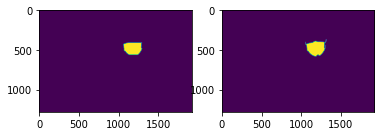

confidence:  0.8124844431877136


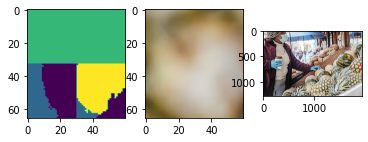

index:  129
dice coefficient:  0.0
MASKS:


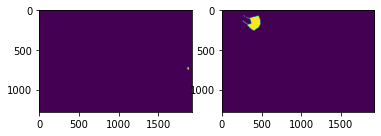

index:  130
dice coefficient:  0.0
MASKS:


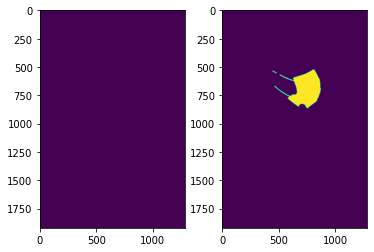

confidence:  0.9819275736808777


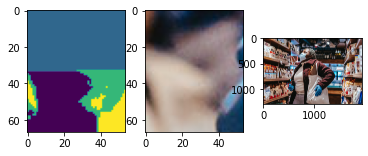

confidence:  0.9755254983901978


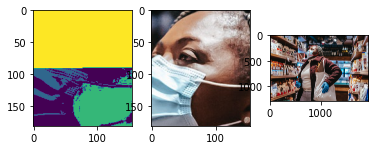

index:  131
dice coefficient:  0.00018254004472231095
MASKS:


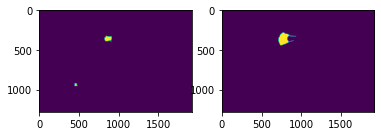

confidence:  0.878998875617981


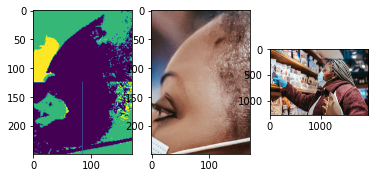

index:  132
dice coefficient:  0.04996692616903272
MASKS:


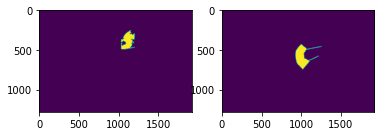

confidence:  0.9994125366210938


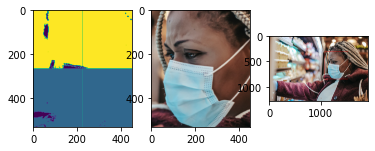

index:  133
dice coefficient:  0.665353027244668
MASKS:


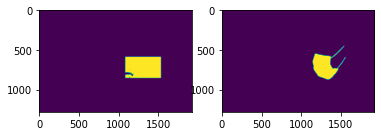

confidence:  0.9986317753791809


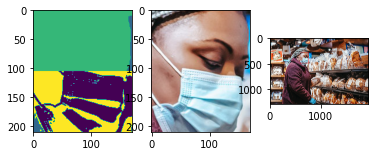

confidence:  0.905866265296936


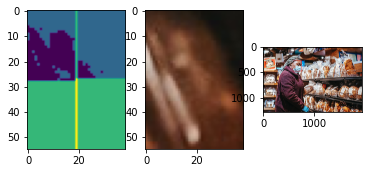

confidence:  0.8688852190971375


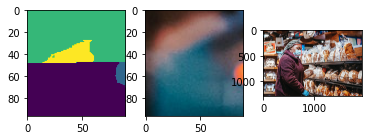

confidence:  0.8495544791221619


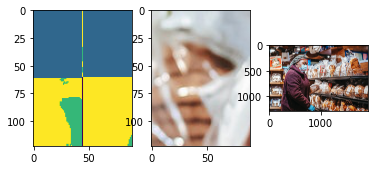

confidence:  0.8068411350250244


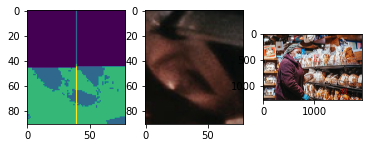

confidence:  0.8026371598243713


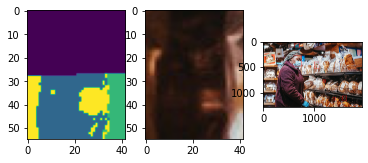

index:  134
dice coefficient:  0.3952236970224978
MASKS:


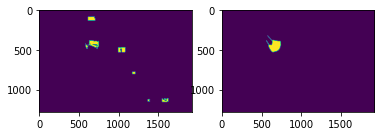

confidence:  0.9999898672103882


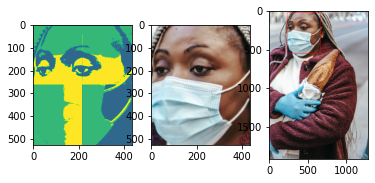

index:  135
dice coefficient:  0.5033425692115221
MASKS:


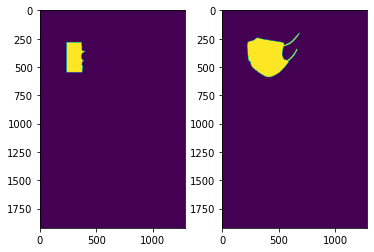

confidence:  0.9990231990814209


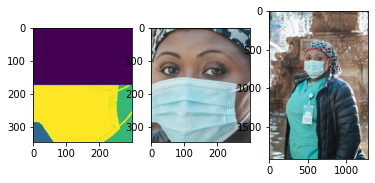

index:  136
dice coefficient:  0.8995423315965965
MASKS:


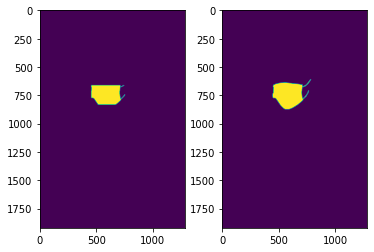

confidence:  0.999681830406189


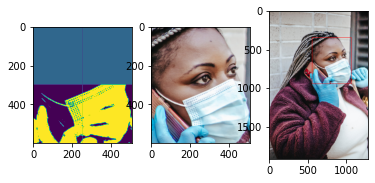

index:  137
dice coefficient:  0.8650714312829793
MASKS:


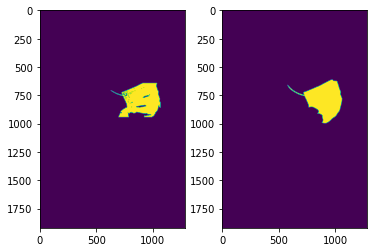

confidence:  0.9999338388442993


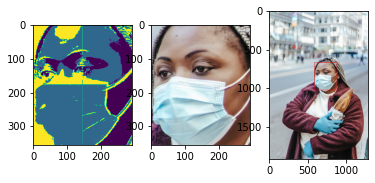

index:  138
dice coefficient:  0.9144797529444794
MASKS:


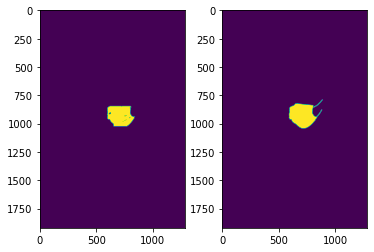

confidence:  0.9980331063270569


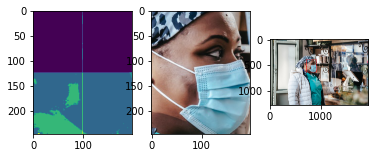

index:  139
dice coefficient:  0.7469785357412008
MASKS:


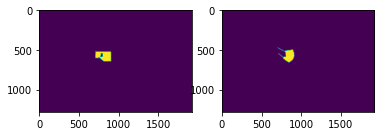

confidence:  0.9996178150177002


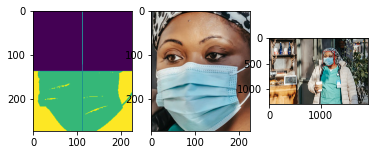

index:  140
dice coefficient:  0.925942331624797
MASKS:


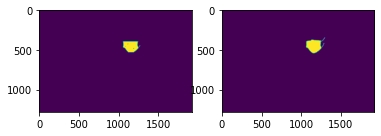

confidence:  0.9999880790710449


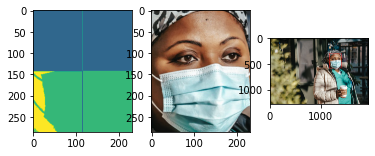

index:  141
dice coefficient:  0.9039572695511959
MASKS:


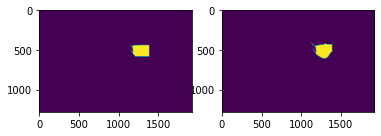

confidence:  0.9998852014541626


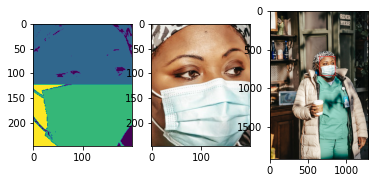

confidence:  0.8402611613273621


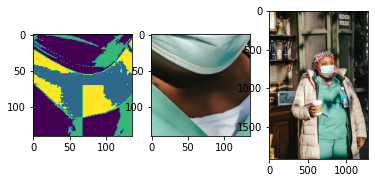

index:  142
dice coefficient:  0.7745071563597083
MASKS:


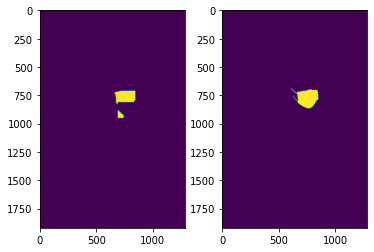

confidence:  0.9999932050704956


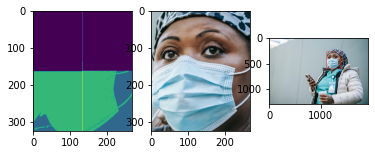

confidence:  0.9376680254936218


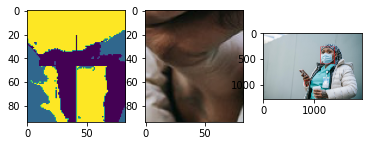

index:  143
dice coefficient:  0.8785176135206679
MASKS:


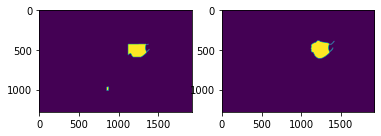

confidence:  0.9988749623298645


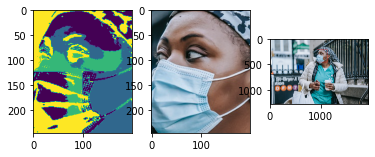

confidence:  0.8618074655532837


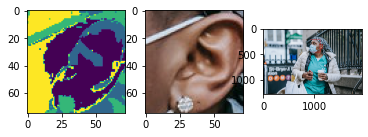

index:  144
dice coefficient:  0.46054360605851025
MASKS:


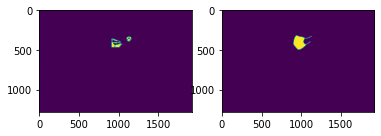

confidence:  0.9999878406524658


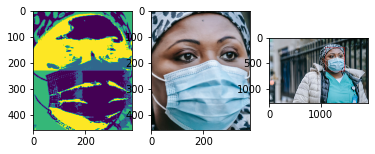

index:  145
dice coefficient:  0.7438214389625504
MASKS:


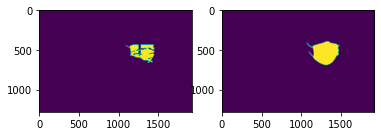

confidence:  0.999913215637207


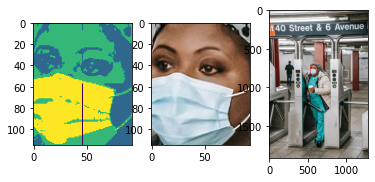

index:  146
dice coefficient:  0.8024316109422492
MASKS:


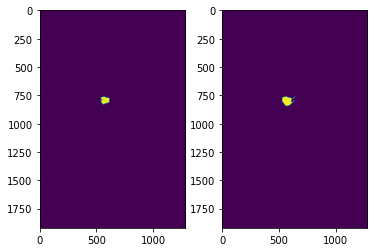

confidence:  0.9999916553497314


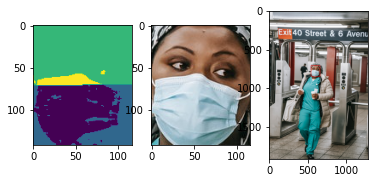

index:  147
dice coefficient:  0.1724209650582363
MASKS:


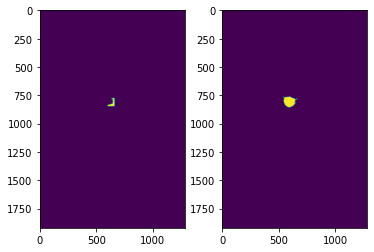

confidence:  0.9998831748962402


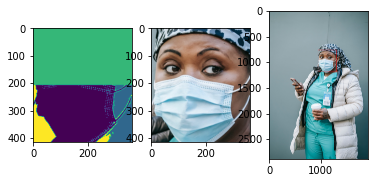

index:  148
dice coefficient:  0.9161386112363126
MASKS:


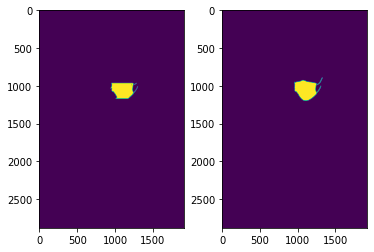

confidence:  0.9999943971633911


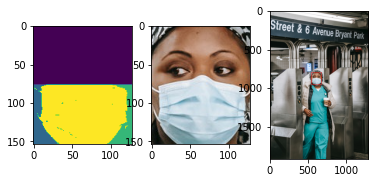

index:  149
dice coefficient:  0.9161905883738736
MASKS:


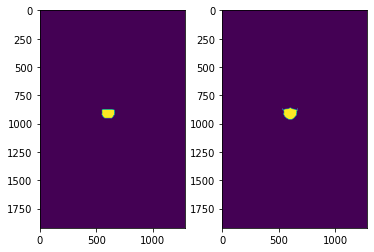

confidence:  0.9999439716339111


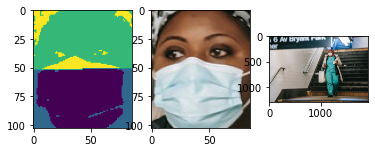

index:  150
dice coefficient:  0.8723643169058016
MASKS:


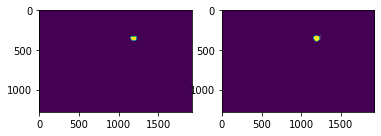

confidence:  0.9999992847442627


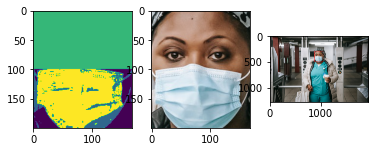

confidence:  0.9644191861152649


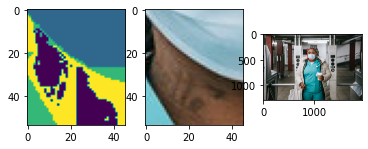

index:  151
dice coefficient:  0.817370422253352
MASKS:


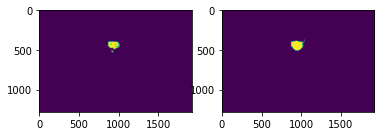

confidence:  0.9999200105667114


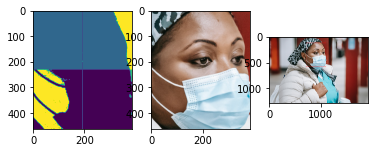

index:  152
dice coefficient:  0.8670268134606763
MASKS:


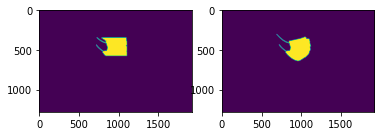

confidence:  0.9967610239982605


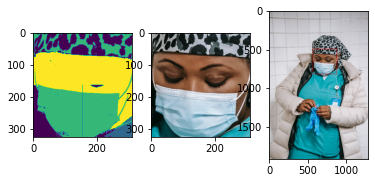

index:  153
dice coefficient:  0.9597676063757733
MASKS:


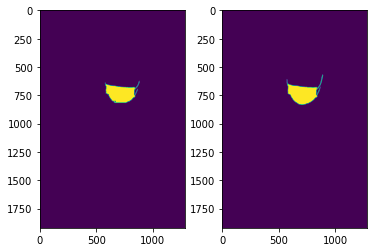

confidence:  0.9999902248382568


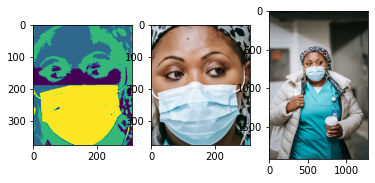

index:  154
dice coefficient:  0.9750837494469377
MASKS:


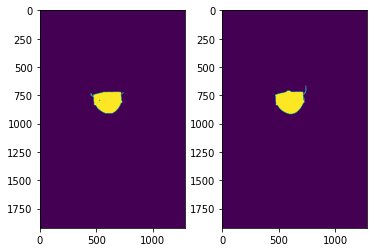

confidence:  0.9998231530189514


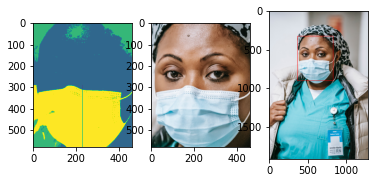

index:  155
dice coefficient:  0.9376458387347679
MASKS:


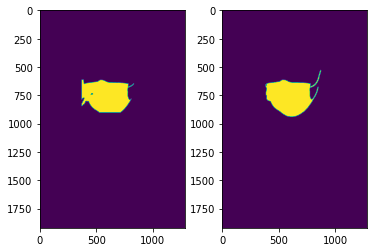

confidence:  0.9997968077659607


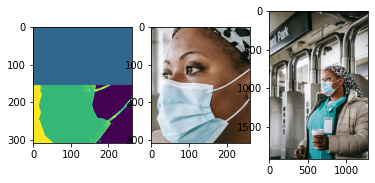

index:  156
dice coefficient:  0.9034076146697312
MASKS:


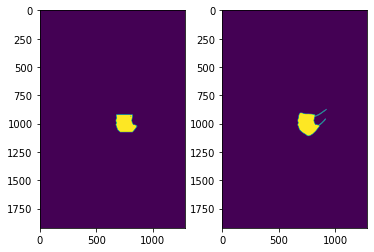

confidence:  0.9999985694885254


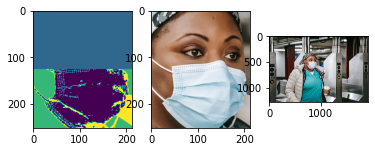

index:  157
dice coefficient:  0.8255992119951844
MASKS:


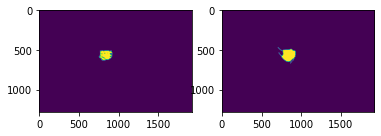

confidence:  0.9996740818023682


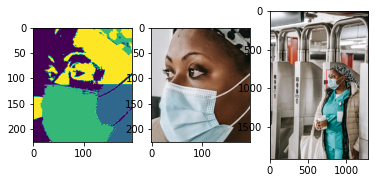

index:  158
dice coefficient:  0.8792702427678442
MASKS:


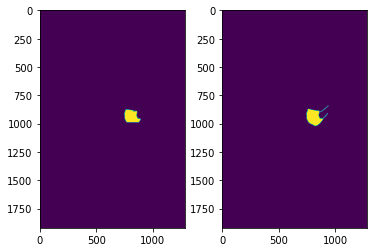

index:  159
dice coefficient:  0.0
MASKS:


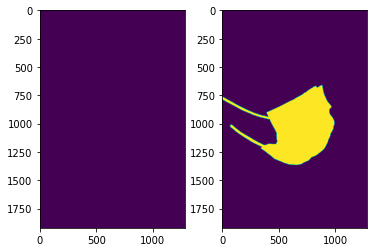

confidence:  0.9998754262924194


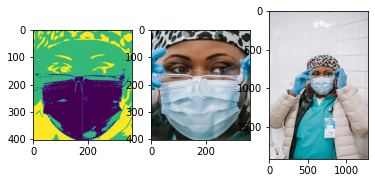

index:  160
dice coefficient:  0.9208978631640855
MASKS:


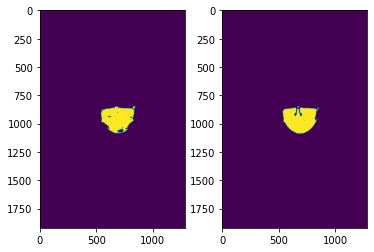

index:  161
dice coefficient:  0.0
MASKS:


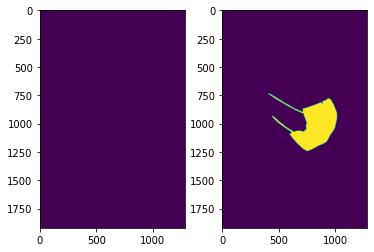

confidence:  0.9544410109519958


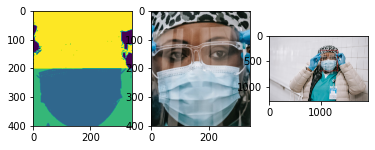

index:  162
dice coefficient:  0.9495425695323293
MASKS:


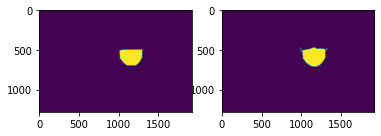

confidence:  0.9985881447792053


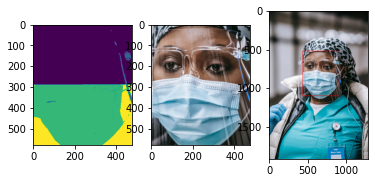

index:  163
dice coefficient:  0.917405073953034
MASKS:


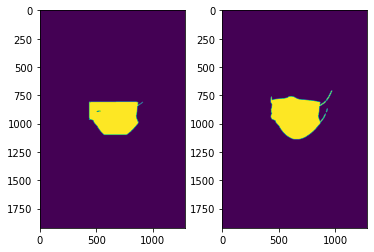

confidence:  0.9999703168869019


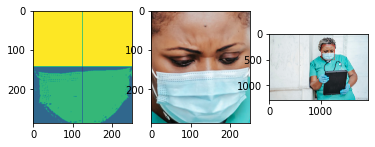

index:  164
dice coefficient:  0.9343071037651236
MASKS:


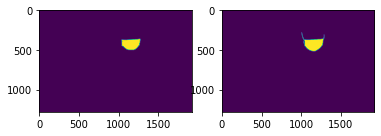

index:  165
dice coefficient:  0.0
MASKS:


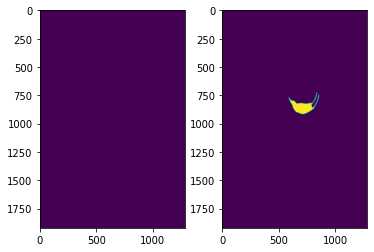

confidence:  0.9999997615814209


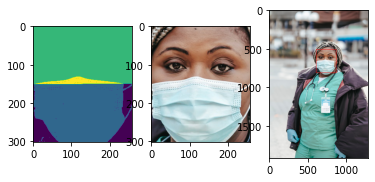

index:  166
dice coefficient:  0.9167279067421721
MASKS:


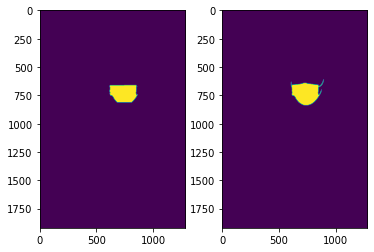

index:  167
dice coefficient:  0.0
MASKS:


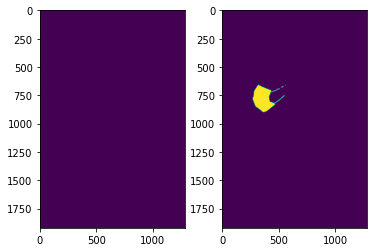

confidence:  0.9999748468399048


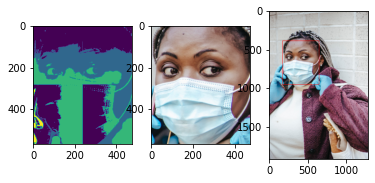

index:  168
dice coefficient:  0.556315912819311
MASKS:


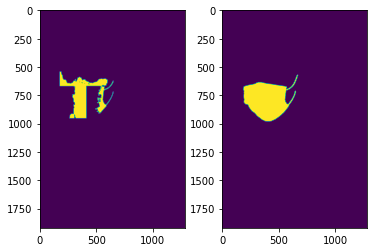

confidence:  0.999815046787262


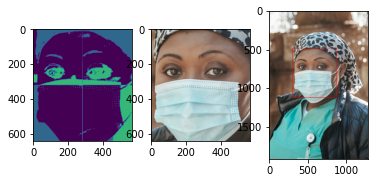

index:  169
dice coefficient:  0.6577776110233045
MASKS:


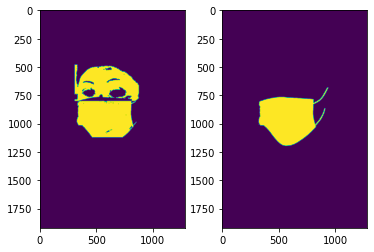

index:  170
dice coefficient:  0.0
MASKS:


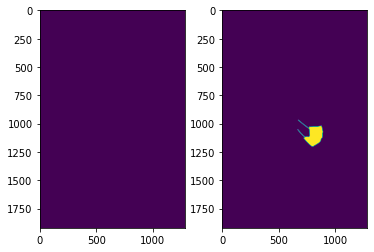

confidence:  0.9991463422775269


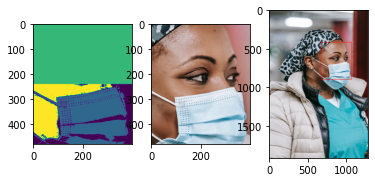

confidence:  0.9872635006904602


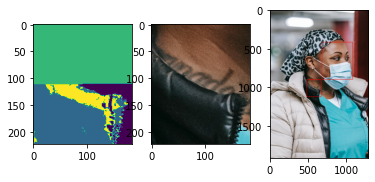

index:  171
dice coefficient:  0.0
MASKS:


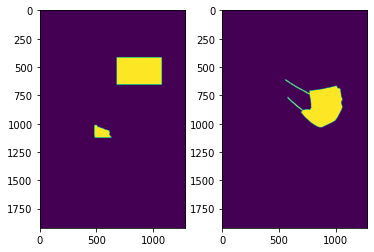

confidence:  0.9987296462059021


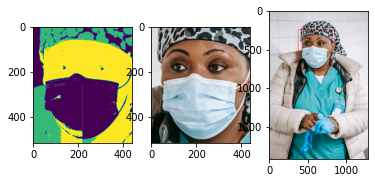

confidence:  0.7265469431877136


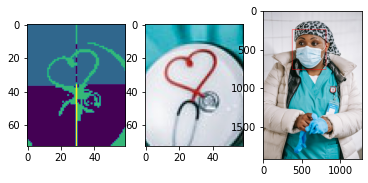

index:  172
dice coefficient:  0.9427014996118732
MASKS:


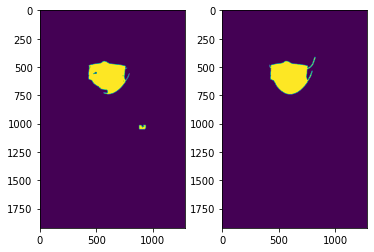

confidence:  0.9998817443847656


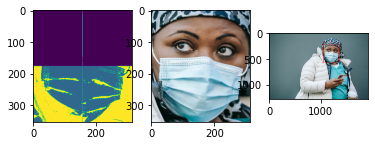

confidence:  0.9788154363632202


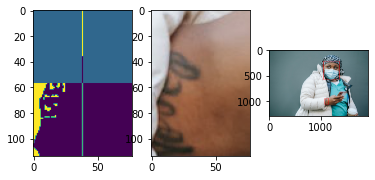

index:  173
dice coefficient:  0.16999884242033372
MASKS:


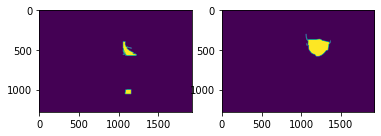

confidence:  0.9999183416366577


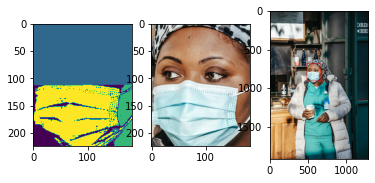

index:  174
dice coefficient:  0.849688351551978
MASKS:


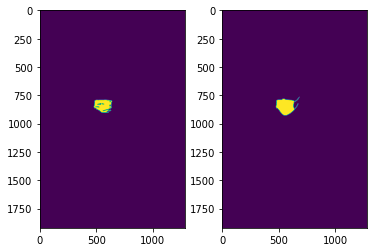

confidence:  0.9998281002044678


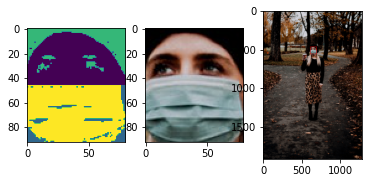

index:  175
dice coefficient:  0.8082765219471355
MASKS:


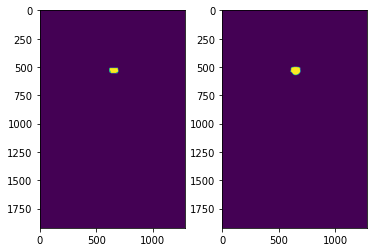

confidence:  0.9986006617546082


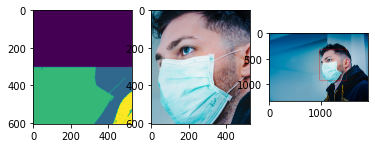

index:  176
dice coefficient:  0.8164519308464824
MASKS:


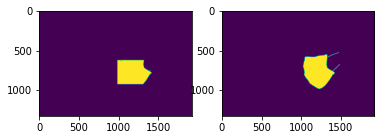

confidence:  0.9994407296180725


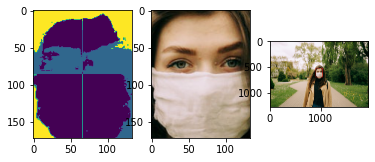

confidence:  0.7855775952339172


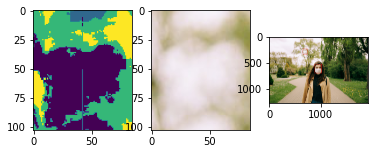

index:  177
dice coefficient:  0.7448135898977751
MASKS:


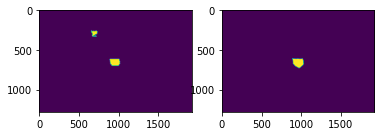

index:  178
dice coefficient:  0.0
MASKS:


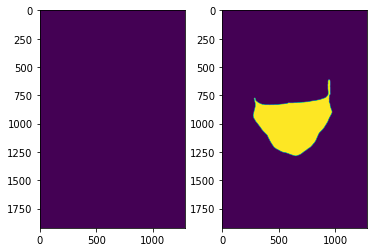

confidence:  0.9983258843421936


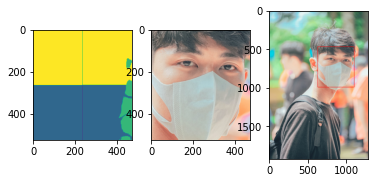

index:  179
dice coefficient:  0.8067482173924801
MASKS:


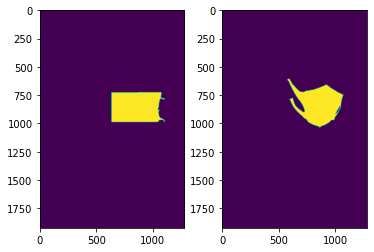

confidence:  0.9964060187339783


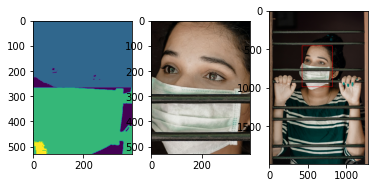

index:  180
dice coefficient:  0.7382892492771519
MASKS:


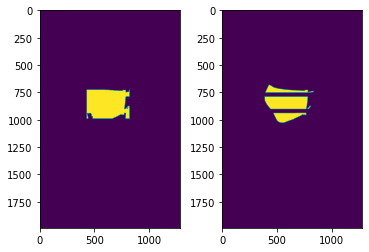

confidence:  0.9782752990722656


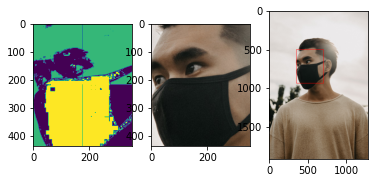

index:  181
dice coefficient:  0.7851540991413307
MASKS:


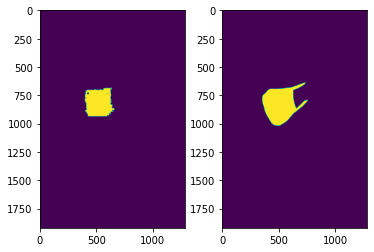

confidence:  0.9982819557189941


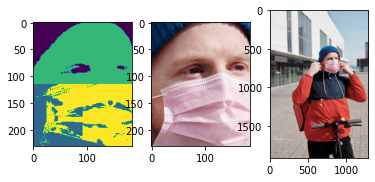

index:  182
dice coefficient:  0.21230439938680473
MASKS:


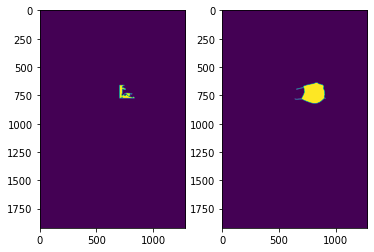

confidence:  0.9993232488632202


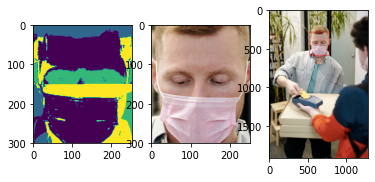

index:  183
dice coefficient:  0.8996318014455202
MASKS:


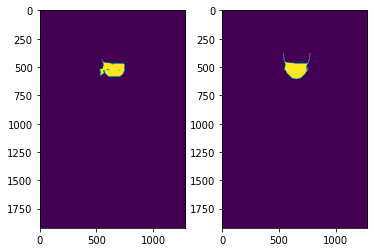

confidence:  0.9999825954437256


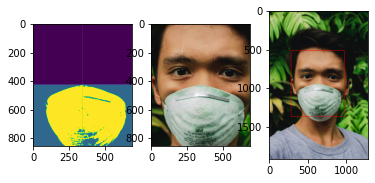

index:  184
dice coefficient:  0.9194488728695425
MASKS:


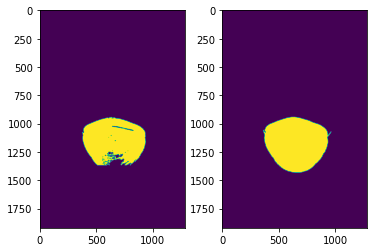

confidence:  0.9999921321868896


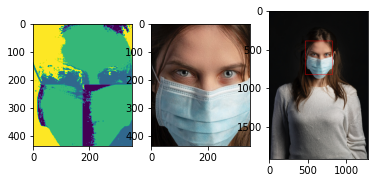

index:  185
dice coefficient:  0.5234893933455931
MASKS:


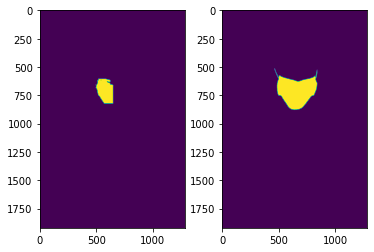

confidence:  0.9999911785125732


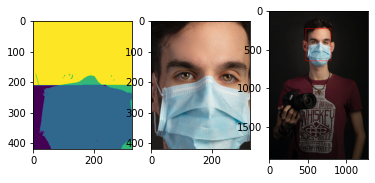

confidence:  0.7909272909164429


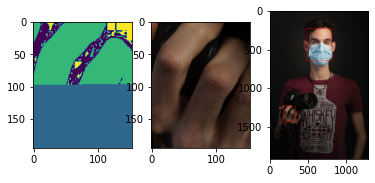

index:  186
dice coefficient:  0.7781171373599021
MASKS:


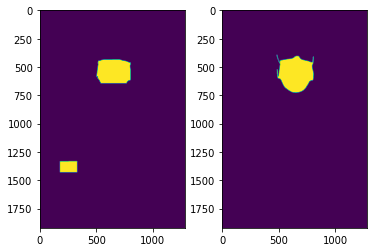

confidence:  0.9794935584068298


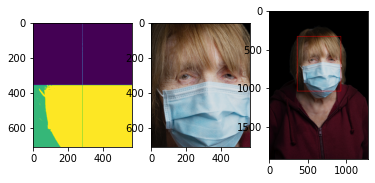

index:  187
dice coefficient:  0.9024081258376243
MASKS:


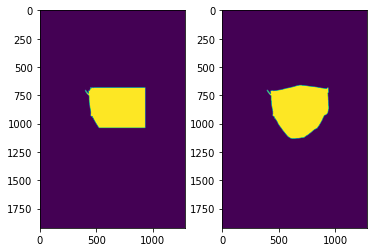

confidence:  0.9965408444404602


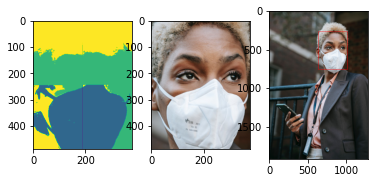

index:  188
dice coefficient:  0.9068501944508722
MASKS:


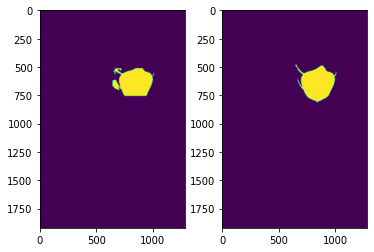

confidence:  0.7779253721237183


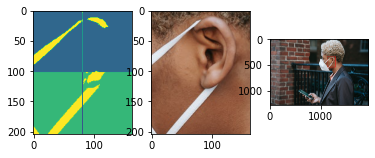

index:  189
dice coefficient:  4.501969611705121e-05
MASKS:


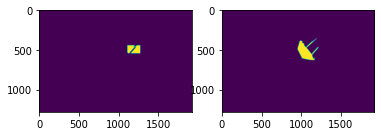

confidence:  0.9997641444206238


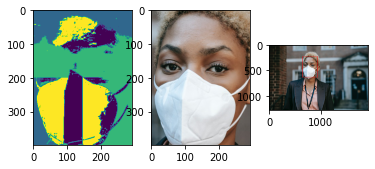

index:  190
dice coefficient:  0.021155626074309136
MASKS:


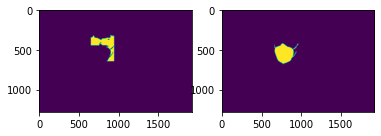

confidence:  0.9946252703666687


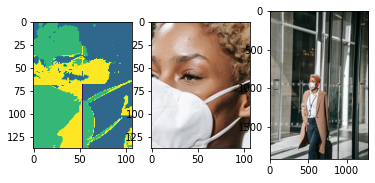

index:  191
dice coefficient:  0.6526119015474089
MASKS:


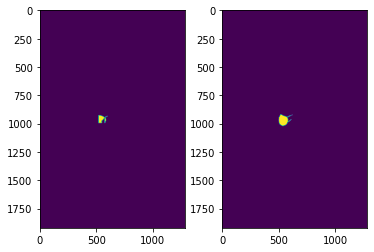

confidence:  0.9987884163856506


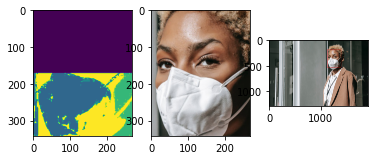

index:  192
dice coefficient:  0.3707436499030909
MASKS:


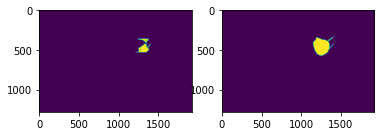

confidence:  0.9779669046401978


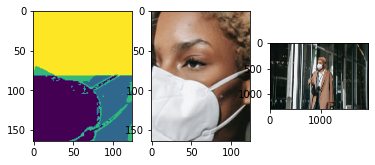

index:  193
dice coefficient:  0.7642852541390195
MASKS:


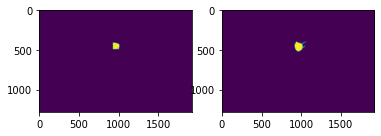

index:  194
dice coefficient:  0.0
MASKS:


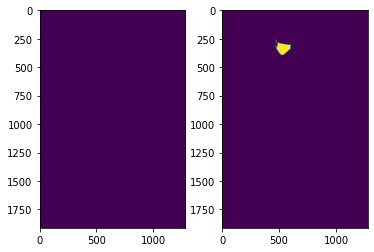

index:  195
dice coefficient:  0.0
MASKS:


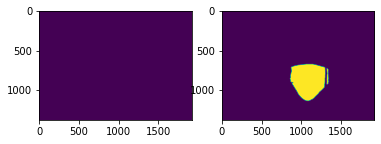

confidence:  0.9992243051528931


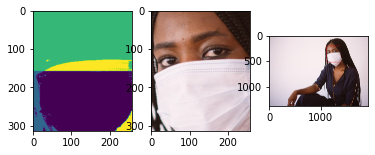

index:  196
dice coefficient:  0.776193171921268
MASKS:


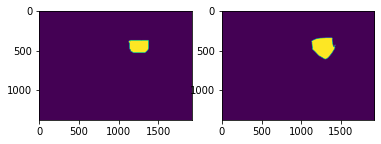

confidence:  0.9990015625953674


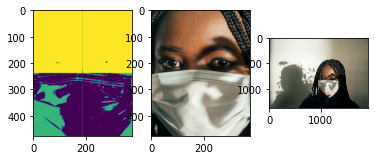

index:  197
dice coefficient:  0.7703523693803159
MASKS:


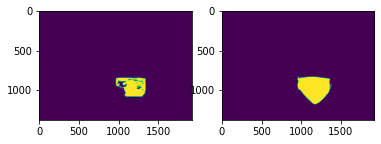

confidence:  0.9993981122970581


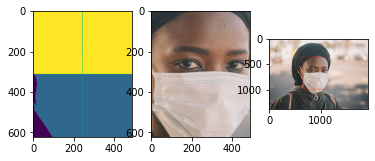

index:  198
dice coefficient:  0.8886797358089452
MASKS:


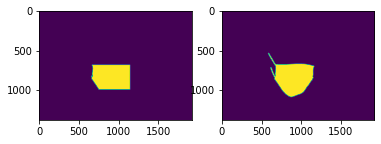

confidence:  0.9996304512023926


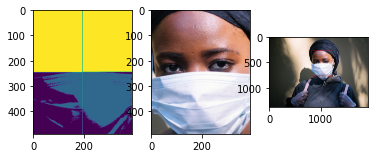

index:  199
dice coefficient:  0.47353008036585853
MASKS:


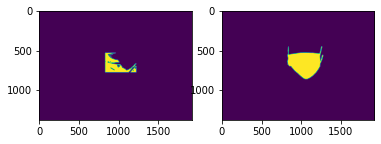

confidence:  0.9979021549224854


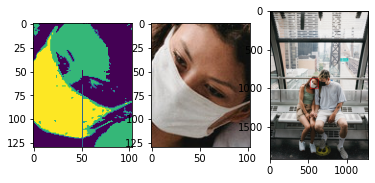

index:  200
dice coefficient:  0.569877064635342
MASKS:


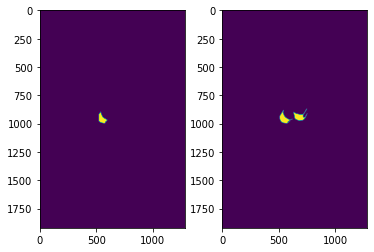

confidence:  0.9817606806755066


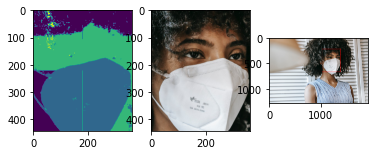

index:  201
dice coefficient:  0.9509082658379285
MASKS:


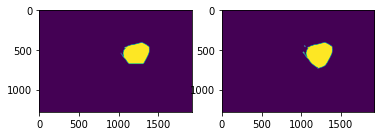

index:  202
dice coefficient:  0.0
MASKS:


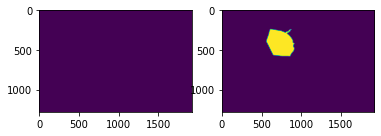

confidence:  0.9819064140319824


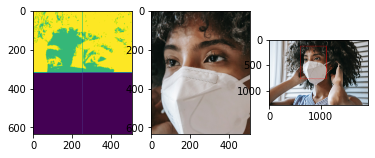

index:  203
dice coefficient:  0.8060199424546086
MASKS:


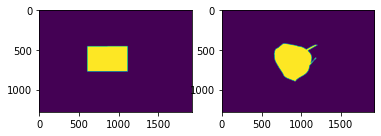

confidence:  0.9919495582580566


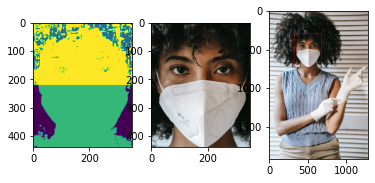

index:  204
dice coefficient:  0.865267111632295
MASKS:


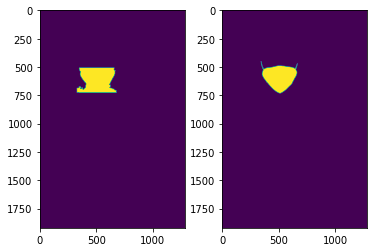

confidence:  0.9957284331321716


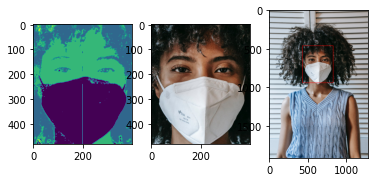

index:  205
dice coefficient:  0.9607150099950749
MASKS:


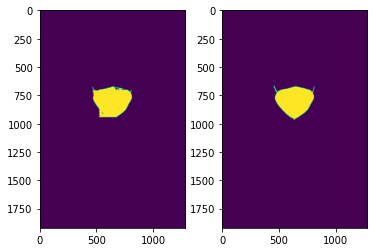

confidence:  0.9278143644332886


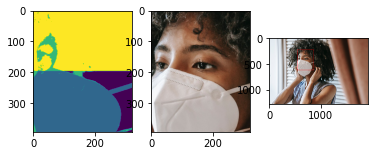

index:  206
dice coefficient:  0.7900341473677397
MASKS:


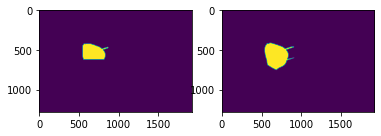

index:  207
dice coefficient:  0.0
MASKS:


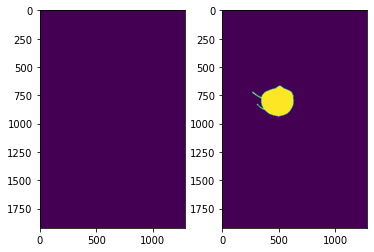

confidence:  0.7388884425163269


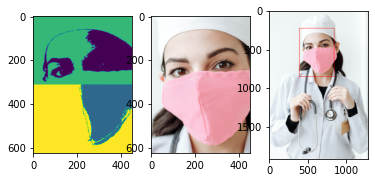

index:  208
dice coefficient:  0.37345872313774614
MASKS:


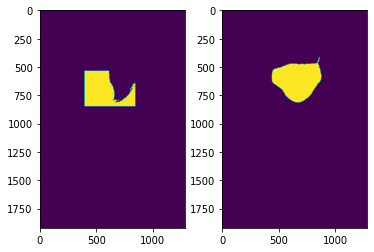

confidence:  0.9990617632865906


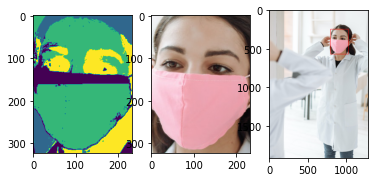

index:  209
dice coefficient:  0.8679817400286561
MASKS:


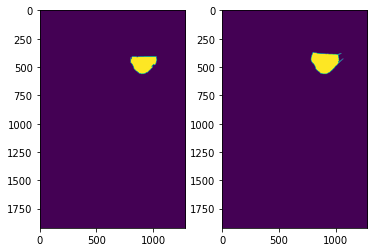

confidence:  0.9897634983062744


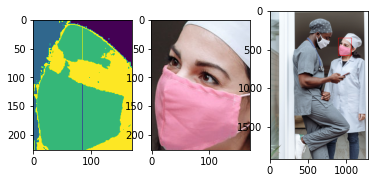

confidence:  0.80375736951828


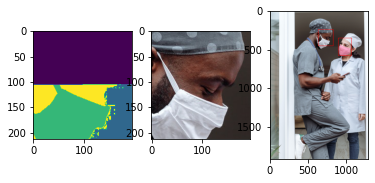

index:  210
dice coefficient:  0.8459444389779921
MASKS:


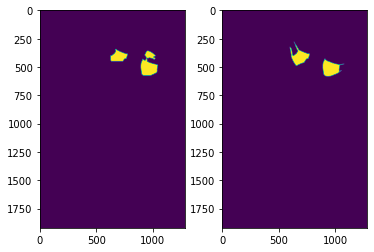

confidence:  0.9999728202819824


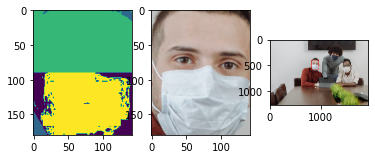

confidence:  0.9955888986587524


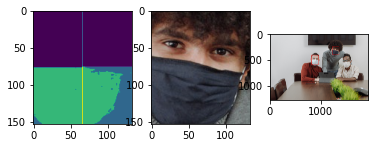

confidence:  0.978398859500885


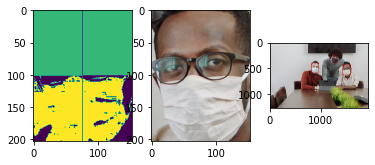

index:  211
dice coefficient:  0.673746529752149
MASKS:


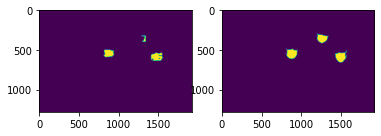

confidence:  0.9798121452331543


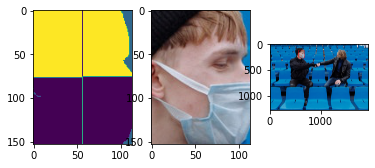

index:  212
dice coefficient:  0.4772843287391526
MASKS:


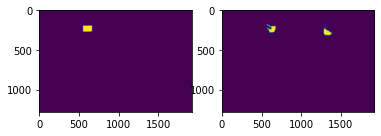

confidence:  0.9974899291992188


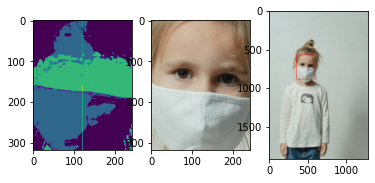

index:  213
dice coefficient:  0.47125845479660855
MASKS:


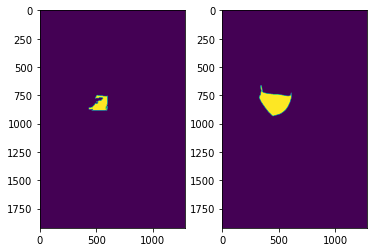

confidence:  0.9998946189880371


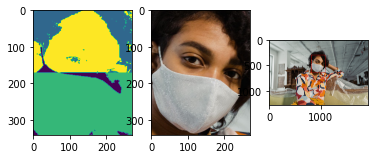

index:  214
dice coefficient:  0.7745890911094885
MASKS:


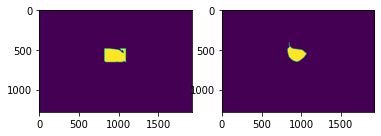

confidence:  0.9965863227844238


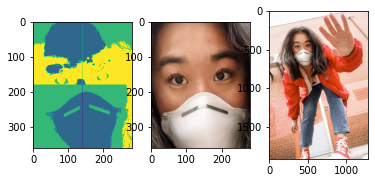

index:  215
dice coefficient:  0.7472385797414544
MASKS:


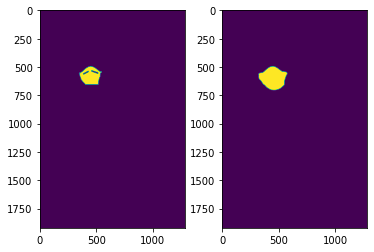

confidence:  0.9995672106742859


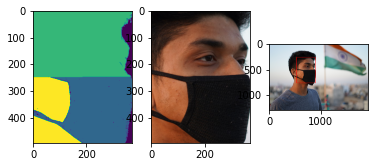

index:  216
dice coefficient:  0.9115867297685479
MASKS:


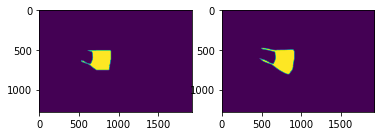

confidence:  0.9995026588439941


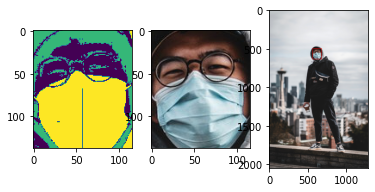

confidence:  0.7444947957992554


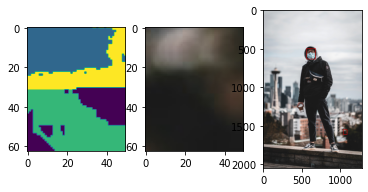

index:  217
dice coefficient:  0.8839934380126553
MASKS:


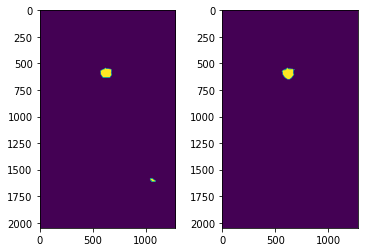

confidence:  0.9997262358665466


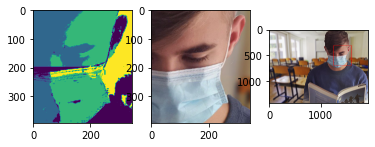

index:  218
dice coefficient:  0.0013844662882458812
MASKS:


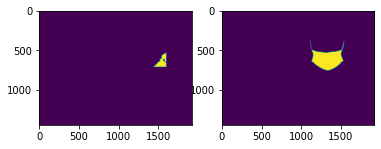

confidence:  0.9991028308868408


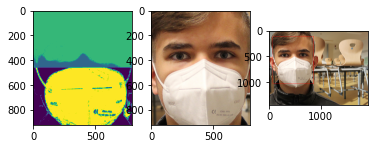

index:  219
dice coefficient:  0.9218828718693081
MASKS:


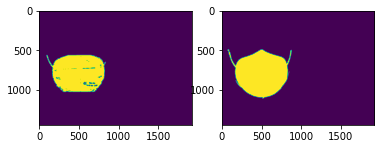

confidence:  0.9998894929885864


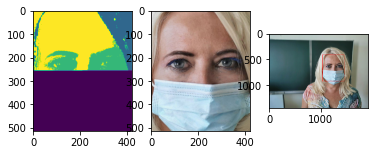

index:  220
dice coefficient:  0.793054621047029
MASKS:


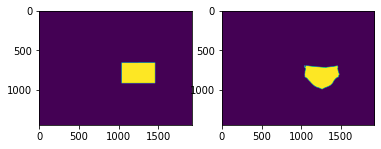

confidence:  0.9989116191864014


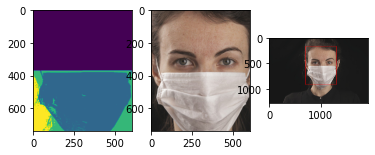

index:  221
dice coefficient:  0.9419139952562255
MASKS:


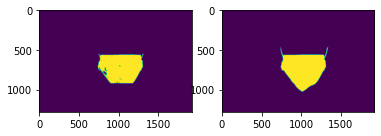

In [ ]:
detector = MTCNN()
add2sides = 0
n_components = 4
dice_coefs = []
dbscan = False

for k in range(len(col)):
  try:
    img = col[k]
    true_mask = true_masks[k];
    true_mask = rgb2gray(true_mask[:,:,:3])
    true_mask = (true_mask > 0)*1
    mask = np.zeros(true_mask.shape, dtype=int)
    boxed_img = np.copy(img);
    boxes = detector.detect_faces(img)
    best_components = []
    if boxes:
      for i in range(len(boxes)):
        box = boxes[i]['box']
        conf = boxes[i]['confidence']
        x, y, w, h = box[0] - add2sides, box[1], box[2] + add2sides, box[3]
        if conf < 0.75 and i > 1 or (w < 50 and h < 50):
          continue
        print("confidence: ", conf)
        boxed_img = cv2.rectangle(boxed_img, (x, y), (x + w, y + h), (255, 0, 0), 4)
        # h += np.int(np.power(h,2/3)*2);
        clip = img[y:y+h,x:x+w,:]
        labels = GMM(clip, h, w, n_components)
        main_components = find_main_components(labels, clip, boxed_img)
        best_component = None
        # import pdb; pdb.set_trace()
        while len(main_components) == 1:
          if dbscan:
            break
          if main_components[0][1] > 0.8:
            n_components += 1;
            labels = GMM(clip, h, w, n_components)
            main_components = find_main_components(labels, clip, boxed_img)
          else:
            best_component = main_components[0]
            best_components.append([best_component, box])
            break
        if len(main_components) > 1:
          idx_lowest_centroid = 0;
          val_lowest_centroid = 0;
          for j in range(len(main_components)):
            if main_components[j][2][0] > val_lowest_centroid:
              val_lowest_centroid = main_components[j][2][0];
              idx_lowest_centroid = j;
              best_component = main_components[j];
              best_components.append([best_component, box])
            else:
              continue
    for comp in best_components:
      bound_box = comp[1]
      x, y, w, h = bound_box[0] - add2sides, bound_box[1], bound_box[2] + add2sides, bound_box[3]
      mask[y:y+h,x:x+w] = comp[0][-1]

    DC = dice_coef(mask, true_mask);
    dice_coefs.append(DC)
    print("index: ", k)
    print("dice coefficient: ", DC)
    print("MASKS:")
    plt.figure(2)
    plt.subplot(1,2,1)
    plt.imshow(mask)
    plt.subplot(1,2,2)
    plt.imshow(true_mask)
    plt.show()

  except:
    print("EXCEPTION RAISED")
    continue




(array([0.1719457 , 0.18099548, 0.19004525, 0.21266968, 0.26696833,
        0.32126697, 0.37104072, 0.53846154, 0.7918552 , 1.        ]),
 array([0.        , 0.09750837, 0.19501675, 0.29252512, 0.3900335 ,
        0.48754187, 0.58505025, 0.68255862, 0.780067  , 0.87757537,
        0.97508375]),
 <a list of 1 Patch objects>)

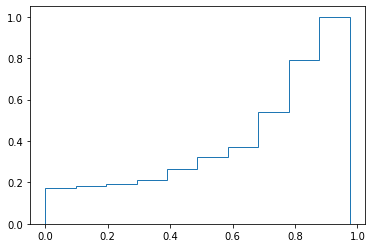

In [ ]:
plt.hist(dice_coefs, density=True, histtype='step', cumulative=True)

In [ ]:
np.average(np.array(dice_coefs))


0.6243435157359158

In [ ]:
print(dice_coefs)

[0.8653663708912328, 0.7635999887815869, 0.8271394711518797, 0.8719452181014805, 0.7628827383340019, 0.7993050643702952, 0.0, 0.8473613499195979, 0.8755393177128462, 0.8677771891616144, 0.8616636528028933, 0.0, 0.7370173795400146, 0.9070118662351672, 0.8759269823160296, 0.8594273218068749, 0.9384862891126335, 0.026944585663446874, 0.8765475653279731, 0.7397687473012522, 0.69663560708443, 0.6928757121522208, 0.7120778182005831, 0.0, 0.0, 0.899072661110459, 0.6975280898876405, 0.6708201220077507, 0.0, 0.0, 0.0, 0.8901380963492501, 0.0, 0.6903125995358784, 0.0, 0.7089844230627261, 0.77601363169595, 0.441028396547092, 0.0, 0.6170212765957447, 0.8602927821569981, 0.9349701895948352, 0.8967032687065297, 0.8626771653543307, 0.8321130157636316, 0.7385897605503373, 0.8292307033691511, 0.716618808327351, 0.7127512905190933, 0.629080118694362, 0.8665086553519279, 0.7678812795674701, 0.8979419767753803, 0.8355542954352141, 0.5072378022324774, 0.03263309207373969, 0.9196007780364146, 0.660829284826